# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [37]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

(60000, 28, 28)


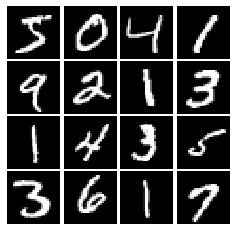

In [38]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tensor=tf.where(x>=0,x,x*alpha)
    return tensor
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tensor=tf.random.uniform((batch_size,dim),-1,1)
    return tensor
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256,input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024,input_shape=(noise_dim,),activation='relu'),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(784,activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    Dx = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real, labels=tf.ones_like(logits_real))
    DGx = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.zeros_like(logits_fake))
    loss = tf.reduce_mean(Dx) + tf.reduce_mean(DGx)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    Gx = tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.ones_like(logits_fake))
    loss=tf.reduce_mean(Gx)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver=tf.optimizers.Adam(learning_rate,beta1)
    G_solver=tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                print(fake_images)
                x=tf.reshape(fake_images, [batch_size, 784])
                logits_fake = D(x)

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.345, G:0.7016
Instructions for updating:
Use tf.identity instead.


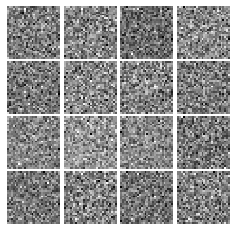

Epoch: 0, Iter: 20, D: 0.5623, G:1.073


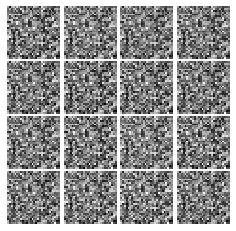

Epoch: 0, Iter: 40, D: 0.4798, G:1.102


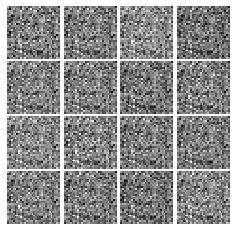

Epoch: 0, Iter: 60, D: 0.3446, G:2.468


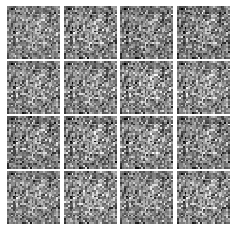

Epoch: 0, Iter: 80, D: 2.364, G:0.3892


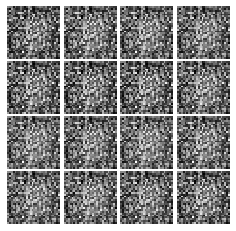

Epoch: 0, Iter: 100, D: 0.9623, G:1.41


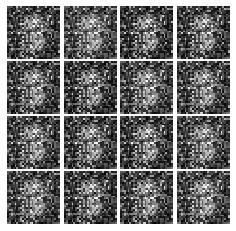

Epoch: 0, Iter: 120, D: 1.199, G:1.545


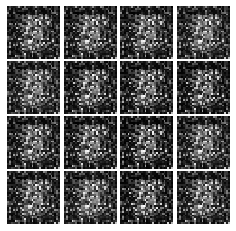

Epoch: 0, Iter: 140, D: 1.273, G:1.282


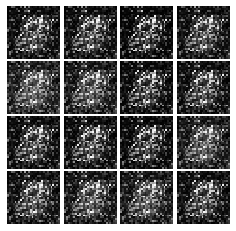

Epoch: 0, Iter: 160, D: 1.441, G:1.245


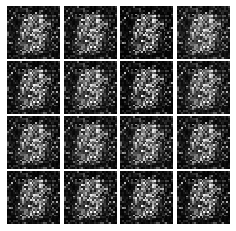

Epoch: 0, Iter: 180, D: 1.682, G:1.33


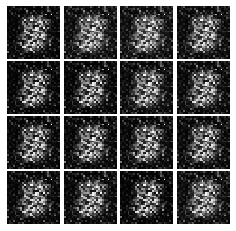

Epoch: 0, Iter: 200, D: 0.9363, G:1.837


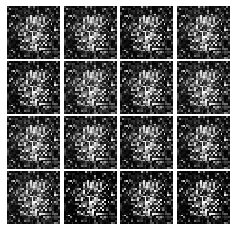

Epoch: 0, Iter: 220, D: 1.427, G:2.004


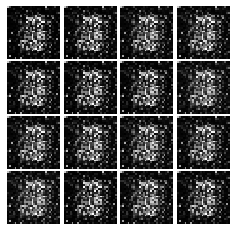

Epoch: 0, Iter: 240, D: 1.667, G:1.247


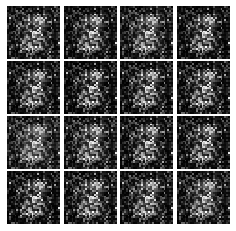

Epoch: 0, Iter: 260, D: 1.186, G:2.24


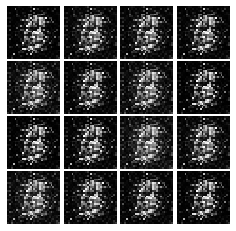

Epoch: 0, Iter: 280, D: 1.051, G:1.368


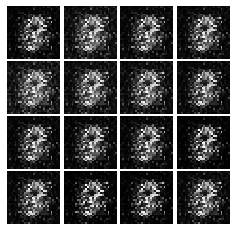

Epoch: 0, Iter: 300, D: 0.8835, G:2.294


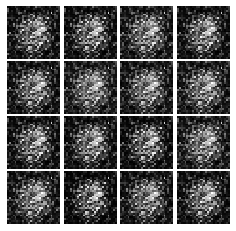

Epoch: 0, Iter: 320, D: 1.121, G:0.9963


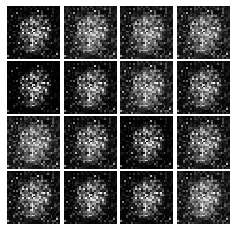

Epoch: 0, Iter: 340, D: 0.7776, G:1.59


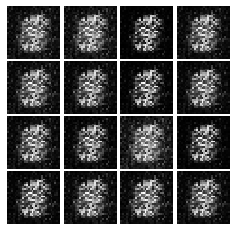

Epoch: 0, Iter: 360, D: 1.981, G:1.114


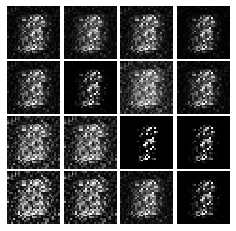

Epoch: 0, Iter: 380, D: 1.104, G:1.068


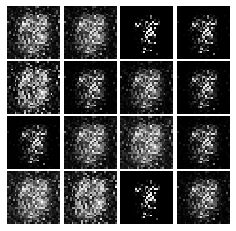

Epoch: 0, Iter: 400, D: 1.471, G:1.478


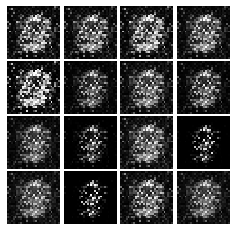

Epoch: 0, Iter: 420, D: 1.045, G:0.9882


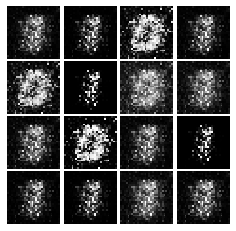

Epoch: 0, Iter: 440, D: 1.064, G:1.064


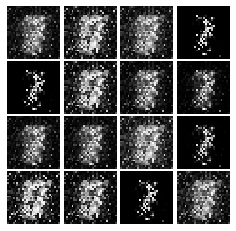

Epoch: 0, Iter: 460, D: 1.369, G:1.465


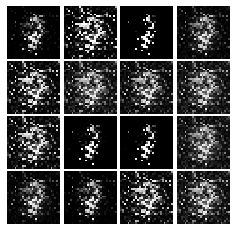

Epoch: 1, Iter: 480, D: 1.541, G:3.099


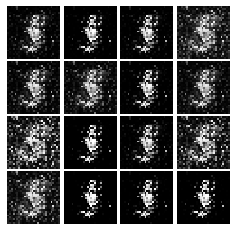

Epoch: 1, Iter: 500, D: 1.083, G:1.28


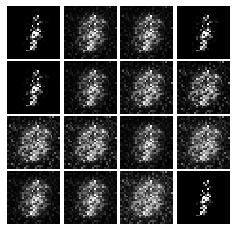

Epoch: 1, Iter: 520, D: 0.945, G:2.378


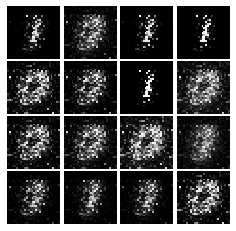

Epoch: 1, Iter: 540, D: 1.569, G:1.217


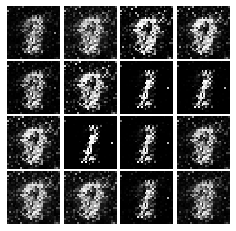

Epoch: 1, Iter: 560, D: 1.21, G:1.55


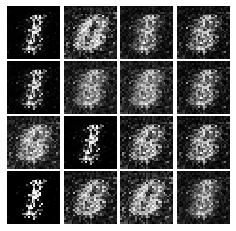

Epoch: 1, Iter: 580, D: 1.308, G:2.061


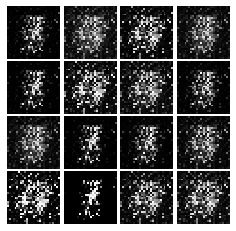

Epoch: 1, Iter: 600, D: 0.9669, G:3.032


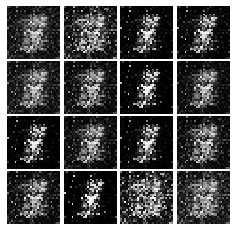

Epoch: 1, Iter: 620, D: 0.8282, G:1.926


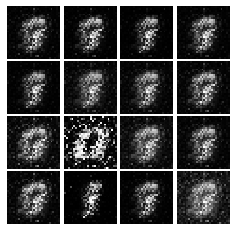

Epoch: 1, Iter: 640, D: 0.7662, G:1.891


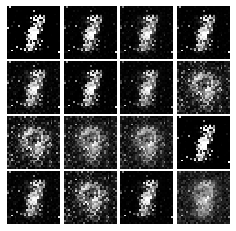

Epoch: 1, Iter: 660, D: 0.8391, G:1.437


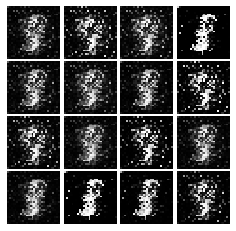

Epoch: 1, Iter: 680, D: 1.541, G:1.85


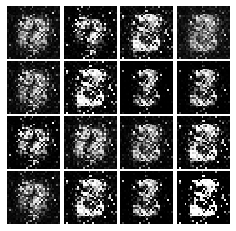

Epoch: 1, Iter: 700, D: 1.135, G:1.238


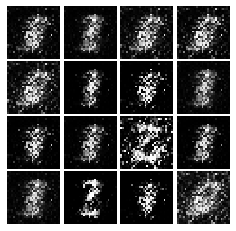

Epoch: 1, Iter: 720, D: 1.381, G:1.5


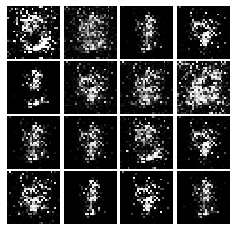

Epoch: 1, Iter: 740, D: 1.252, G:1.312


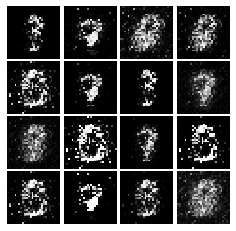

Epoch: 1, Iter: 760, D: 1.111, G:0.6469


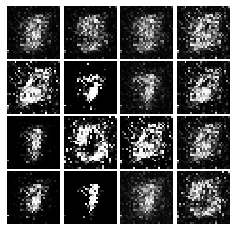

Epoch: 1, Iter: 780, D: 1.129, G:1.281


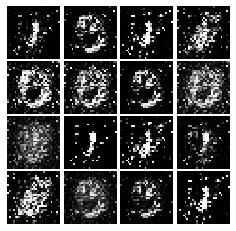

Epoch: 1, Iter: 800, D: 0.9645, G:1.82


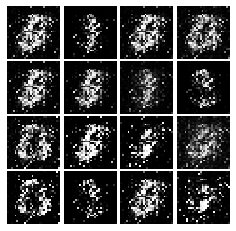

Epoch: 1, Iter: 820, D: 1.237, G:1.43


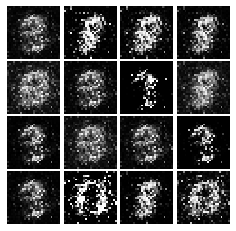

Epoch: 1, Iter: 840, D: 1.231, G:1.518


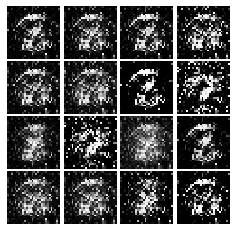

Epoch: 1, Iter: 860, D: 1.454, G:1.44


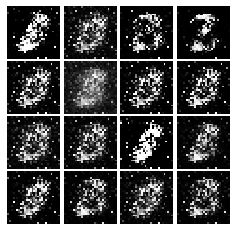

Epoch: 1, Iter: 880, D: 1.275, G:0.5948


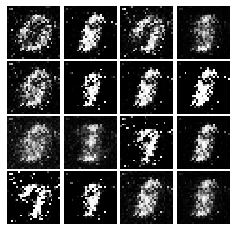

Epoch: 1, Iter: 900, D: 0.9739, G:1.842


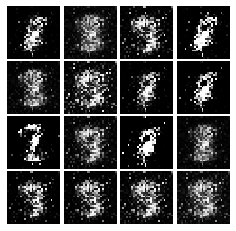

Epoch: 1, Iter: 920, D: 1.35, G:1.482


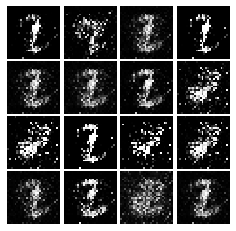

Epoch: 2, Iter: 940, D: 0.9287, G:1.64


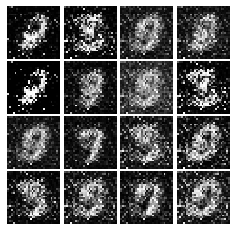

Epoch: 2, Iter: 960, D: 1.116, G:2.022


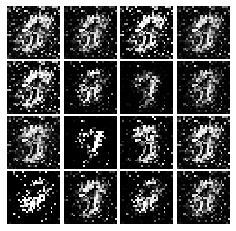

Epoch: 2, Iter: 980, D: 0.9203, G:1.763


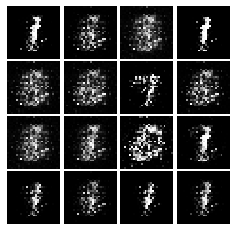

Epoch: 2, Iter: 1000, D: 1.046, G:1.323


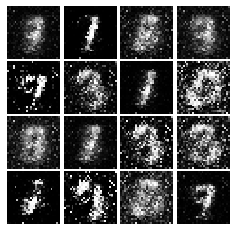

Epoch: 2, Iter: 1020, D: 1.287, G:1.223


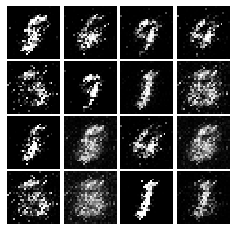

Epoch: 2, Iter: 1040, D: 1.369, G:0.9309


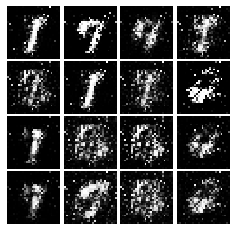

Epoch: 2, Iter: 1060, D: 1.173, G:1.223


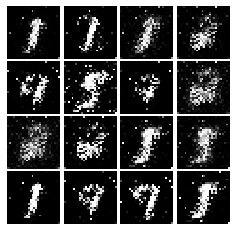

Epoch: 2, Iter: 1080, D: 2.233, G:0.9687


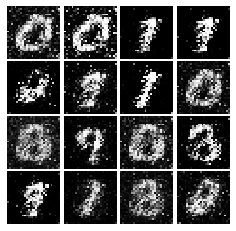

Epoch: 2, Iter: 1100, D: 1.088, G:2.274


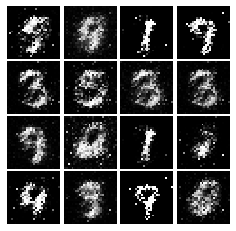

Epoch: 2, Iter: 1120, D: 1.098, G:1.4


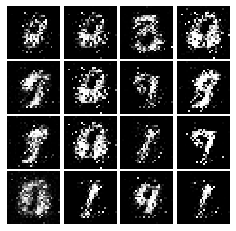

Epoch: 2, Iter: 1140, D: 1.258, G:1.238


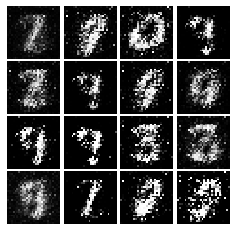

Epoch: 2, Iter: 1160, D: 1.27, G:0.8198


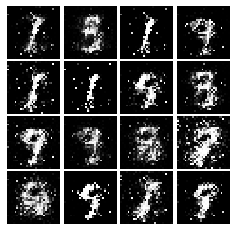

Epoch: 2, Iter: 1180, D: 0.9745, G:1.949


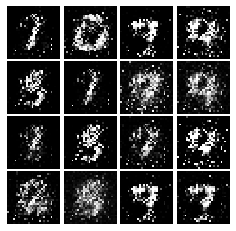

Epoch: 2, Iter: 1200, D: 1.311, G:1.533


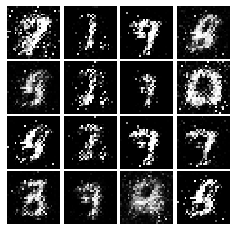

Epoch: 2, Iter: 1220, D: 1.192, G:1.106


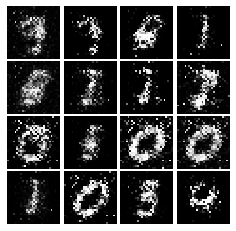

Epoch: 2, Iter: 1240, D: 1.213, G:1.502


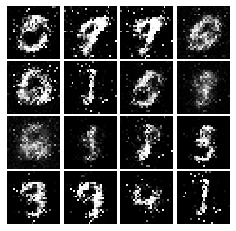

Epoch: 2, Iter: 1260, D: 1.274, G:0.8761


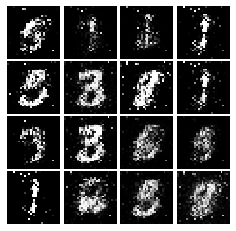

Epoch: 2, Iter: 1280, D: 1.243, G:0.9558


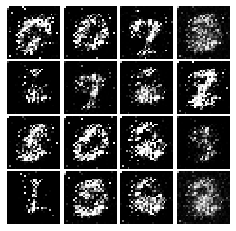

Epoch: 2, Iter: 1300, D: 1.227, G:1.402


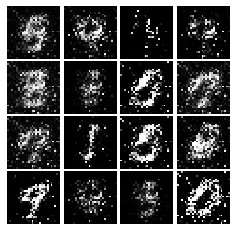

Epoch: 2, Iter: 1320, D: 1.124, G:0.4982


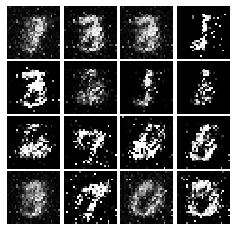

Epoch: 2, Iter: 1340, D: 1.285, G:1.085


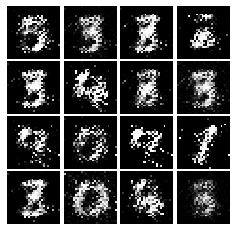

Epoch: 2, Iter: 1360, D: 1.149, G:1.16


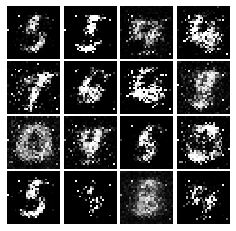

Epoch: 2, Iter: 1380, D: 1.171, G:1.471


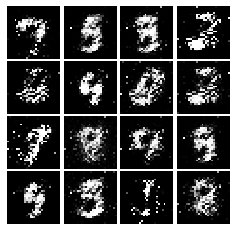

Epoch: 2, Iter: 1400, D: 0.9319, G:1.471


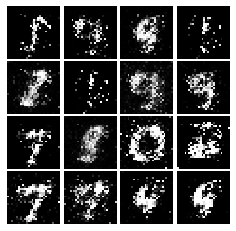

Epoch: 3, Iter: 1420, D: 1.289, G:0.9675


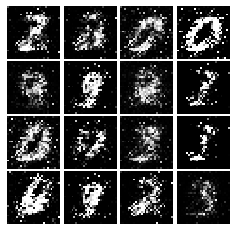

Epoch: 3, Iter: 1440, D: 1.054, G:1.067


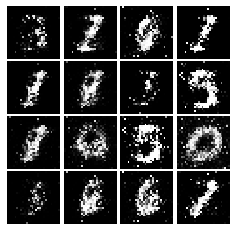

Epoch: 3, Iter: 1460, D: 1.303, G:1.222


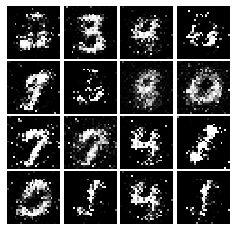

Epoch: 3, Iter: 1480, D: 1.12, G:1.136


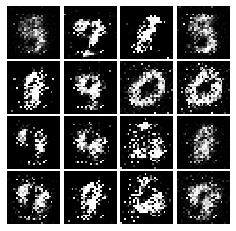

Epoch: 3, Iter: 1500, D: 1.2, G:1.096


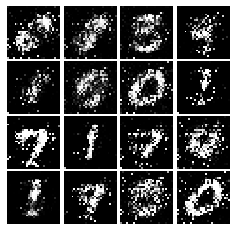

Epoch: 3, Iter: 1520, D: 1.274, G:1.194


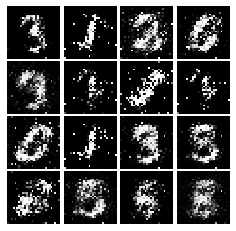

Epoch: 3, Iter: 1540, D: 1.253, G:1.145


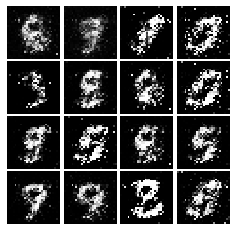

Epoch: 3, Iter: 1560, D: 1.315, G:0.9375


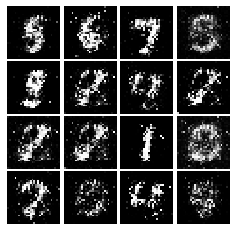

Epoch: 3, Iter: 1580, D: 1.161, G:0.9905


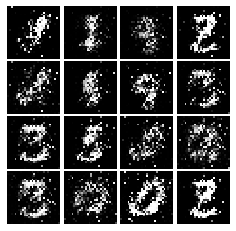

Epoch: 3, Iter: 1600, D: 1.095, G:1.274


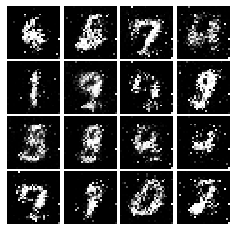

Epoch: 3, Iter: 1620, D: 1.16, G:1.267


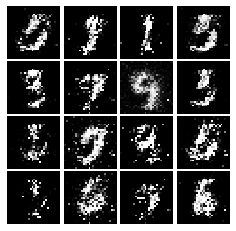

Epoch: 3, Iter: 1640, D: 1.142, G:1.021


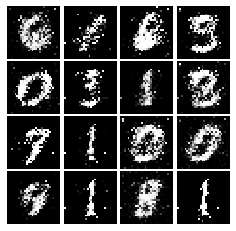

Epoch: 3, Iter: 1660, D: 1.139, G:1.164


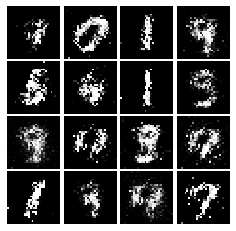

Epoch: 3, Iter: 1680, D: 1.083, G:0.9657


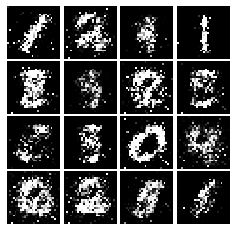

Epoch: 3, Iter: 1700, D: 1.247, G:0.9041


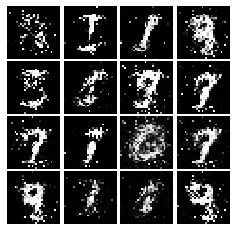

Epoch: 3, Iter: 1720, D: 1.301, G:1.213


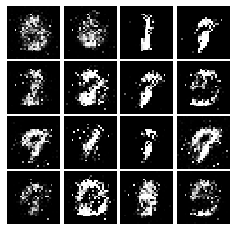

Epoch: 3, Iter: 1740, D: 1.162, G:1.288


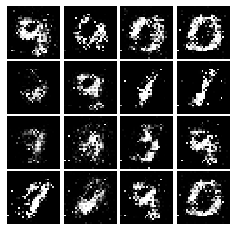

Epoch: 3, Iter: 1760, D: 1.132, G:1.149


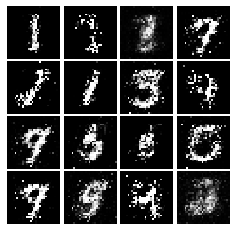

Epoch: 3, Iter: 1780, D: 1.332, G:1.604


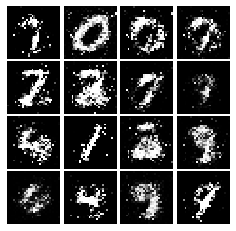

Epoch: 3, Iter: 1800, D: 1.378, G:0.7697


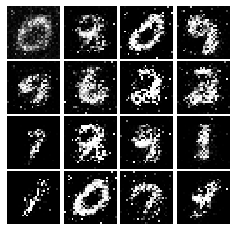

Epoch: 3, Iter: 1820, D: 1.239, G:1.044


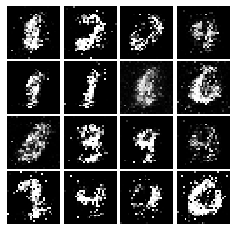

Epoch: 3, Iter: 1840, D: 1.22, G:0.8929


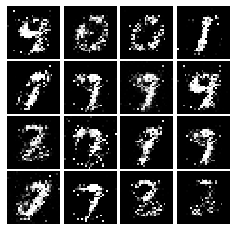

Epoch: 3, Iter: 1860, D: 1.204, G:1.239


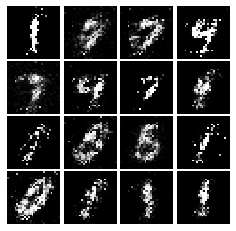

Epoch: 4, Iter: 1880, D: 1.376, G:0.7332


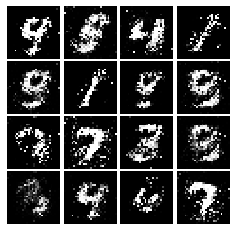

Epoch: 4, Iter: 1900, D: 1.247, G:1.007


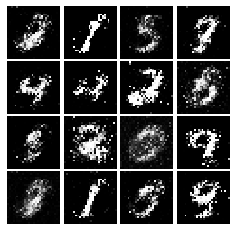

Epoch: 4, Iter: 1920, D: 1.234, G:1.044


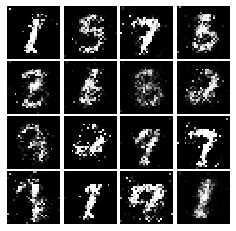

Epoch: 4, Iter: 1940, D: 1.129, G:0.9829


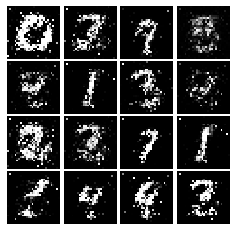

Epoch: 4, Iter: 1960, D: 1.227, G:0.9091


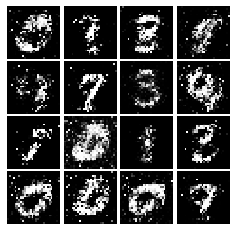

Epoch: 4, Iter: 1980, D: 1.279, G:1.176


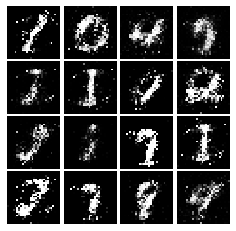

Epoch: 4, Iter: 2000, D: 1.335, G:0.8064


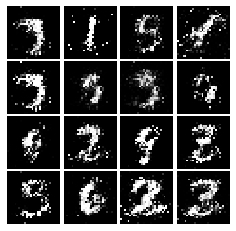

Epoch: 4, Iter: 2020, D: 1.198, G:1.57


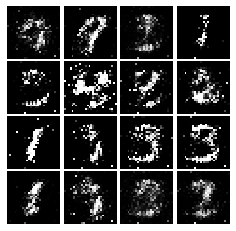

Epoch: 4, Iter: 2040, D: 1.382, G:0.8678


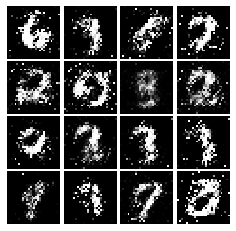

Epoch: 4, Iter: 2060, D: 1.322, G:0.7501


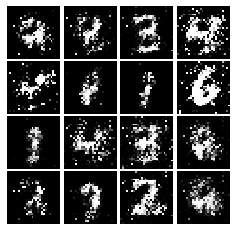

Epoch: 4, Iter: 2080, D: 1.273, G:0.8822


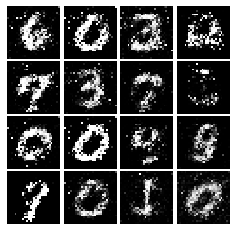

Epoch: 4, Iter: 2100, D: 1.256, G:1.022


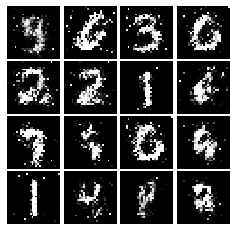

Epoch: 4, Iter: 2120, D: 1.321, G:0.8448


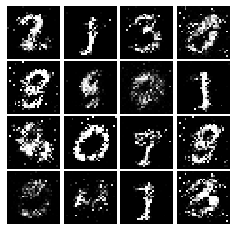

Epoch: 4, Iter: 2140, D: 1.351, G:0.836


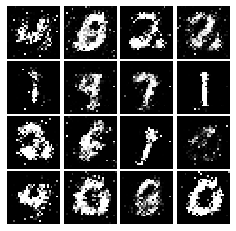

Epoch: 4, Iter: 2160, D: 1.3, G:0.8224


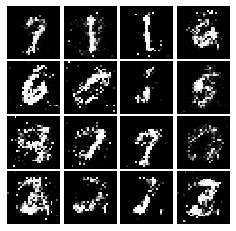

Epoch: 4, Iter: 2180, D: 1.356, G:0.896


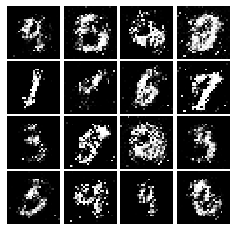

Epoch: 4, Iter: 2200, D: 1.265, G:1.027


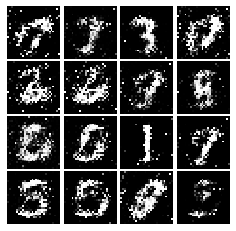

Epoch: 4, Iter: 2220, D: 1.339, G:0.88


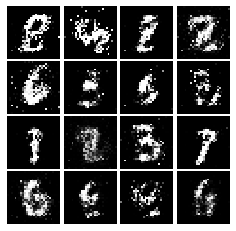

Epoch: 4, Iter: 2240, D: 1.34, G:0.9662


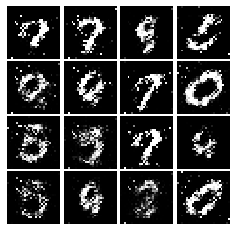

Epoch: 4, Iter: 2260, D: 1.27, G:0.893


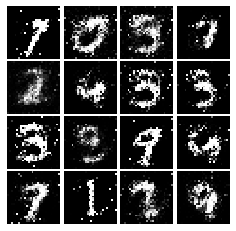

Epoch: 4, Iter: 2280, D: 1.232, G:0.6707


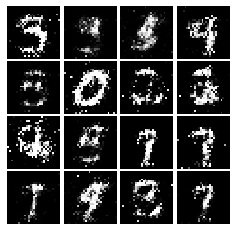

Epoch: 4, Iter: 2300, D: 1.328, G:0.8924


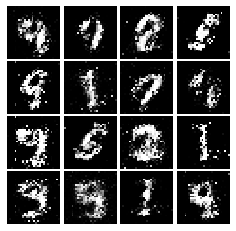

Epoch: 4, Iter: 2320, D: 1.228, G:1.048


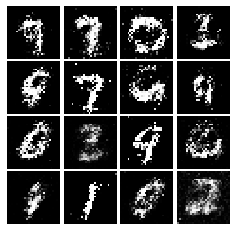

Epoch: 4, Iter: 2340, D: 1.35, G:1.179


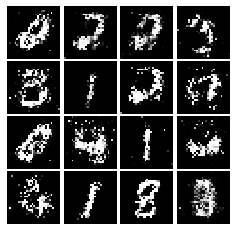

Epoch: 5, Iter: 2360, D: 1.183, G:1.142


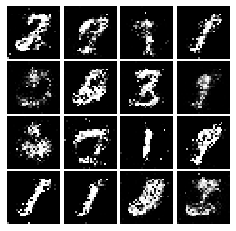

Epoch: 5, Iter: 2380, D: 1.172, G:0.9679


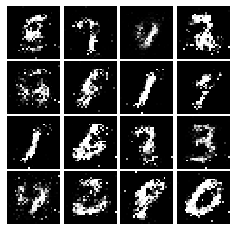

Epoch: 5, Iter: 2400, D: 1.296, G:1.007


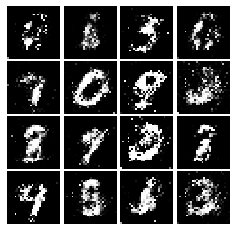

Epoch: 5, Iter: 2420, D: 1.174, G:1.225


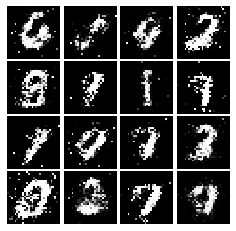

Epoch: 5, Iter: 2440, D: 1.655, G:0.756


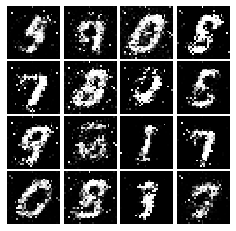

Epoch: 5, Iter: 2460, D: 1.17, G:0.9389


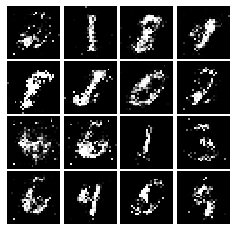

Epoch: 5, Iter: 2480, D: 1.278, G:0.8917


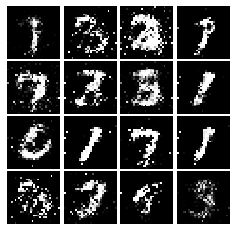

Epoch: 5, Iter: 2500, D: 1.255, G:1.109


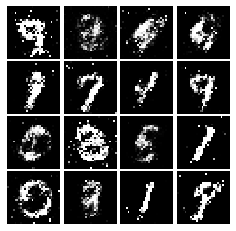

Epoch: 5, Iter: 2520, D: 1.388, G:0.8368


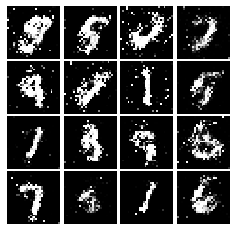

Epoch: 5, Iter: 2540, D: 1.242, G:0.873


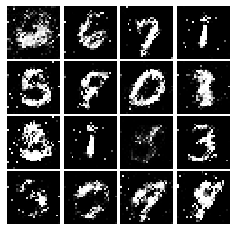

Epoch: 5, Iter: 2560, D: 1.359, G:0.8118


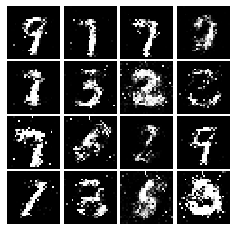

Epoch: 5, Iter: 2580, D: 1.172, G:0.9742


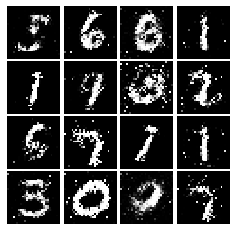

Epoch: 5, Iter: 2600, D: 1.422, G:0.7185


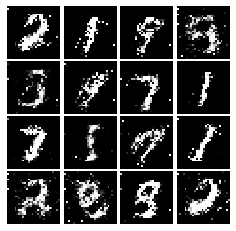

Epoch: 5, Iter: 2620, D: 1.211, G:1.008


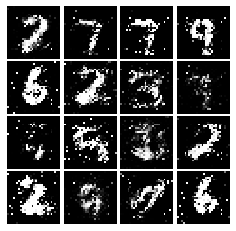

Epoch: 5, Iter: 2640, D: 1.26, G:0.8596


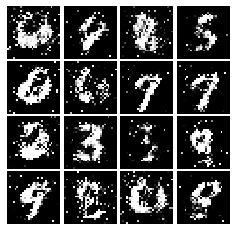

Epoch: 5, Iter: 2660, D: 1.193, G:0.9563


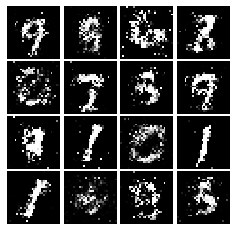

Epoch: 5, Iter: 2680, D: 1.417, G:0.8697


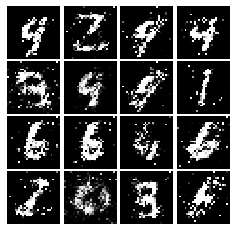

Epoch: 5, Iter: 2700, D: 1.282, G:0.8982


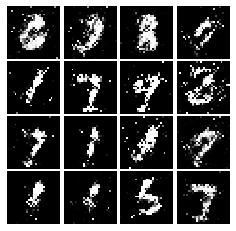

Epoch: 5, Iter: 2720, D: 1.287, G:0.864


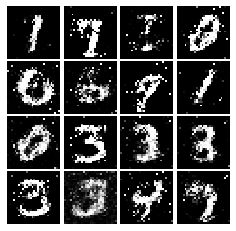

Epoch: 5, Iter: 2740, D: 1.283, G:0.8758


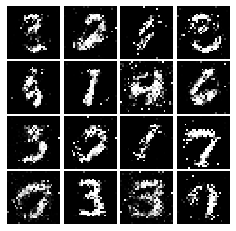

Epoch: 5, Iter: 2760, D: 1.37, G:0.8832


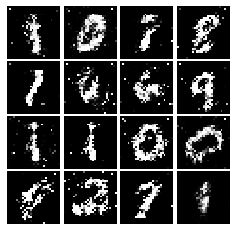

Epoch: 5, Iter: 2780, D: 1.353, G:0.8924


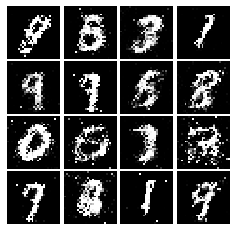

Epoch: 5, Iter: 2800, D: 1.115, G:0.9314


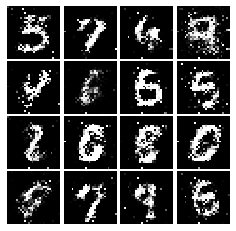

Epoch: 6, Iter: 2820, D: 1.292, G:0.9099


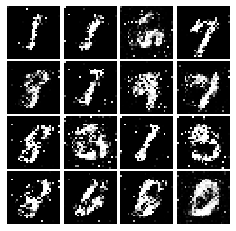

Epoch: 6, Iter: 2840, D: 1.214, G:0.871


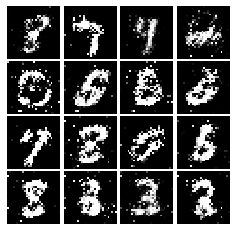

Epoch: 6, Iter: 2860, D: 1.25, G:0.9488


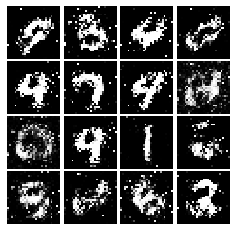

Epoch: 6, Iter: 2880, D: 1.109, G:1.048


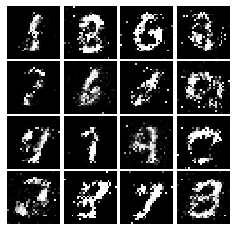

Epoch: 6, Iter: 2900, D: 1.263, G:0.8721


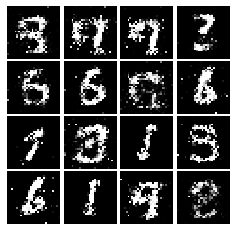

Epoch: 6, Iter: 2920, D: 1.392, G:0.8687


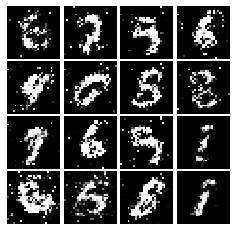

Epoch: 6, Iter: 2940, D: 1.242, G:0.9277


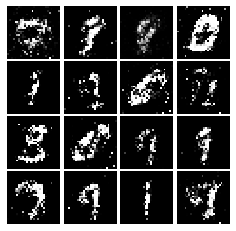

Epoch: 6, Iter: 2960, D: 1.309, G:0.8811


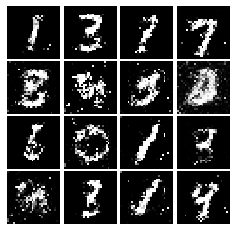

Epoch: 6, Iter: 2980, D: 1.293, G:0.867


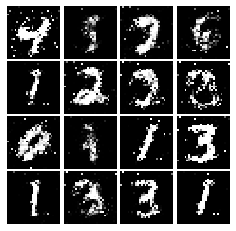

Epoch: 6, Iter: 3000, D: 1.331, G:0.809


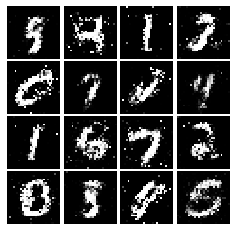

Epoch: 6, Iter: 3020, D: 1.349, G:0.9273


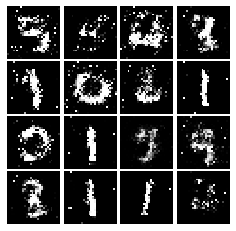

Epoch: 6, Iter: 3040, D: 1.298, G:0.9402


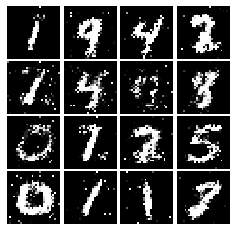

Epoch: 6, Iter: 3060, D: 1.298, G:0.8412


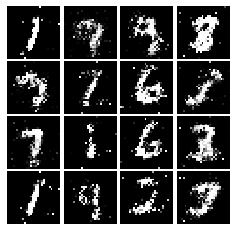

Epoch: 6, Iter: 3080, D: 1.291, G:0.8656


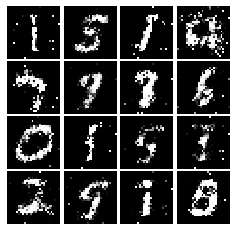

Epoch: 6, Iter: 3100, D: 1.369, G:0.7873


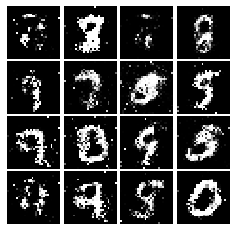

Epoch: 6, Iter: 3120, D: 1.292, G:0.9123


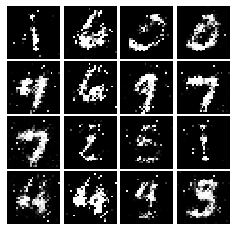

Epoch: 6, Iter: 3140, D: 1.34, G:0.8443


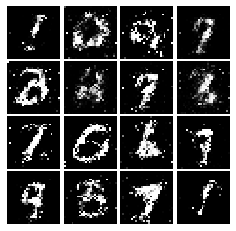

Epoch: 6, Iter: 3160, D: 1.267, G:0.886


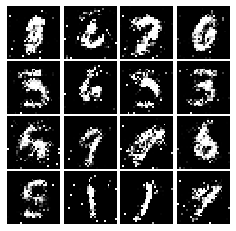

Epoch: 6, Iter: 3180, D: 1.308, G:0.9759


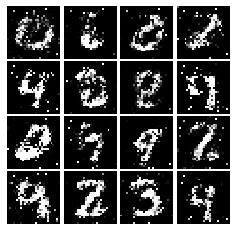

Epoch: 6, Iter: 3200, D: 1.311, G:0.8925


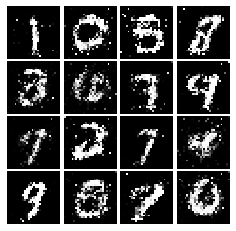

Epoch: 6, Iter: 3220, D: 1.3, G:0.9727


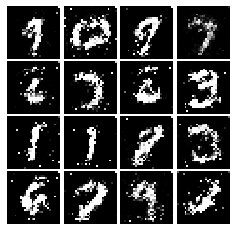

Epoch: 6, Iter: 3240, D: 1.313, G:0.7741


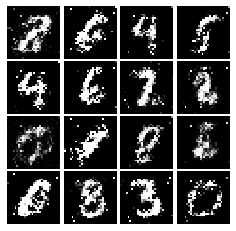

Epoch: 6, Iter: 3260, D: 1.336, G:0.8657


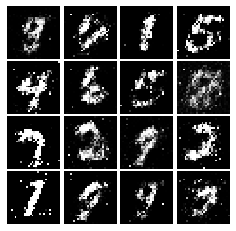

Epoch: 6, Iter: 3280, D: 1.259, G:0.884


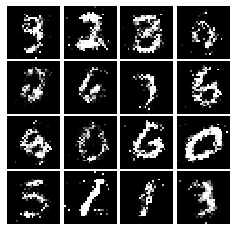

Epoch: 7, Iter: 3300, D: 1.252, G:0.863


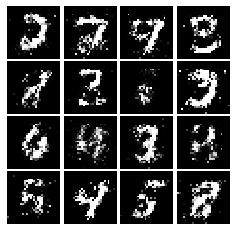

Epoch: 7, Iter: 3320, D: 1.225, G:0.9258


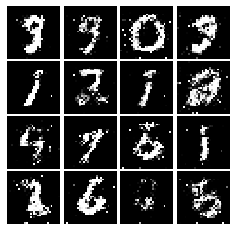

Epoch: 7, Iter: 3340, D: 1.247, G:0.9876


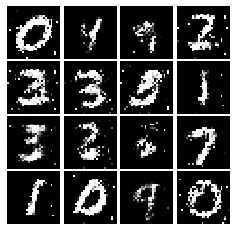

Epoch: 7, Iter: 3360, D: 1.31, G:0.8658


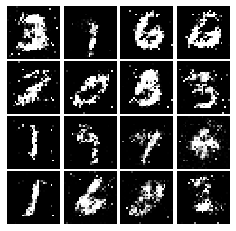

Epoch: 7, Iter: 3380, D: 1.291, G:0.8599


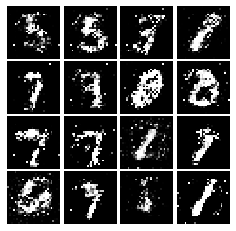

Epoch: 7, Iter: 3400, D: 1.345, G:0.8851


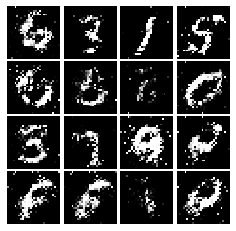

Epoch: 7, Iter: 3420, D: 1.381, G:0.9367


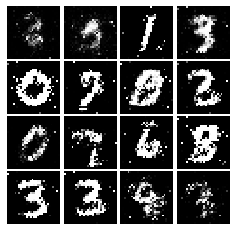

Epoch: 7, Iter: 3440, D: 1.205, G:0.9579


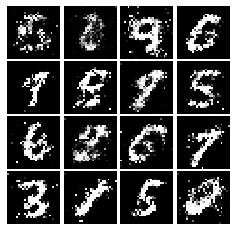

Epoch: 7, Iter: 3460, D: 1.224, G:0.8879


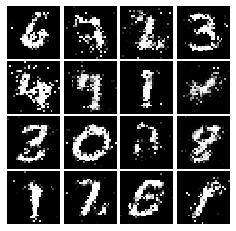

Epoch: 7, Iter: 3480, D: 1.262, G:0.8891


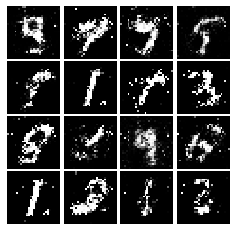

Epoch: 7, Iter: 3500, D: 1.217, G:0.7862


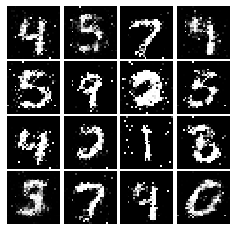

Epoch: 7, Iter: 3520, D: 1.294, G:0.7678


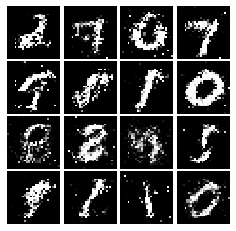

Epoch: 7, Iter: 3540, D: 1.227, G:0.804


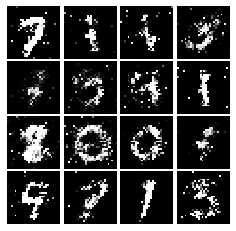

Epoch: 7, Iter: 3560, D: 1.264, G:0.8688


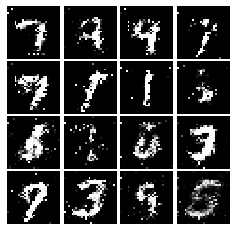

Epoch: 7, Iter: 3580, D: 1.27, G:0.8109


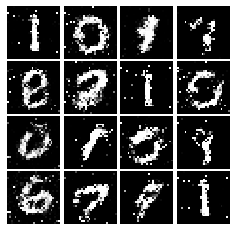

Epoch: 7, Iter: 3600, D: 1.355, G:0.8005


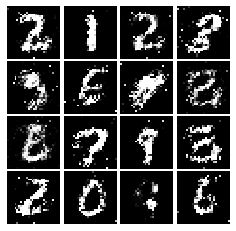

Epoch: 7, Iter: 3620, D: 1.345, G:0.8495


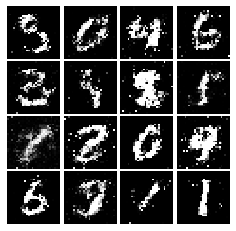

Epoch: 7, Iter: 3640, D: 1.388, G:0.881


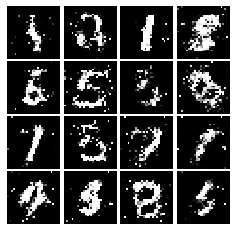

Epoch: 7, Iter: 3660, D: 1.41, G:0.8374


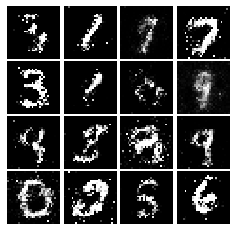

Epoch: 7, Iter: 3680, D: 1.373, G:0.7908


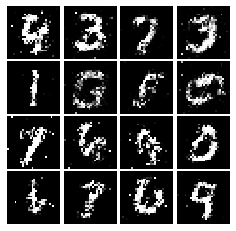

Epoch: 7, Iter: 3700, D: 1.281, G:0.8851


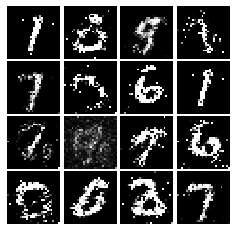

Epoch: 7, Iter: 3720, D: 1.309, G:0.85


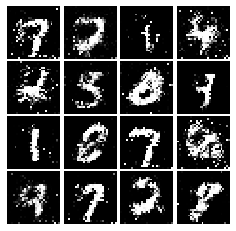

Epoch: 7, Iter: 3740, D: 1.323, G:0.7706


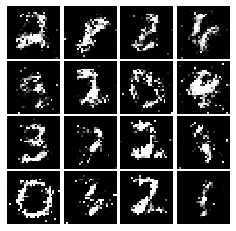

Epoch: 8, Iter: 3760, D: 1.327, G:0.8843


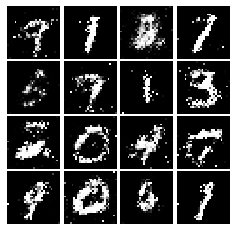

Epoch: 8, Iter: 3780, D: 1.358, G:0.8795


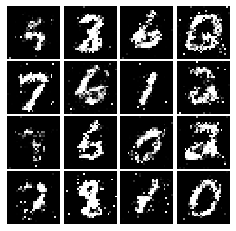

Epoch: 8, Iter: 3800, D: 1.318, G:0.8605


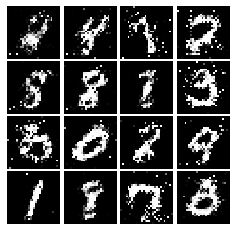

Epoch: 8, Iter: 3820, D: 1.334, G:0.766


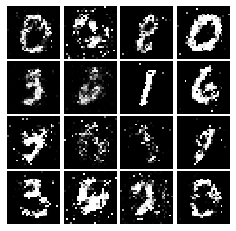

Epoch: 8, Iter: 3840, D: 1.409, G:0.8394


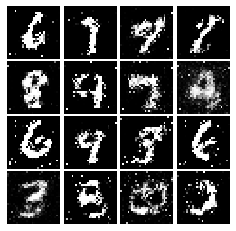

Epoch: 8, Iter: 3860, D: 1.322, G:0.8162


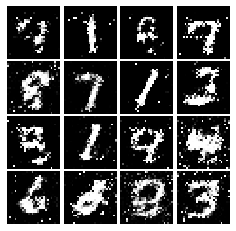

Epoch: 8, Iter: 3880, D: 1.239, G:0.8188


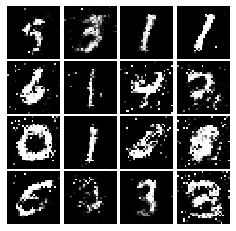

Epoch: 8, Iter: 3900, D: 1.351, G:0.8546


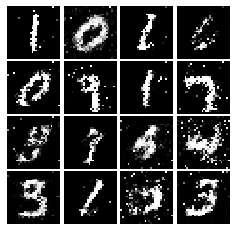

Epoch: 8, Iter: 3920, D: 1.263, G:0.8305


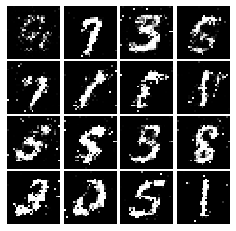

Epoch: 8, Iter: 3940, D: 1.258, G:0.7938


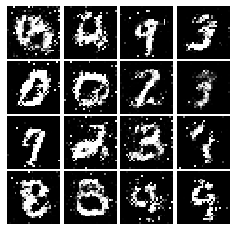

Epoch: 8, Iter: 3960, D: 1.43, G:0.811


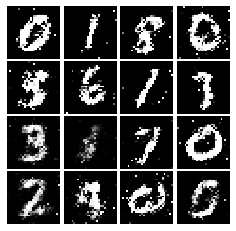

Epoch: 8, Iter: 3980, D: 1.328, G:0.6528


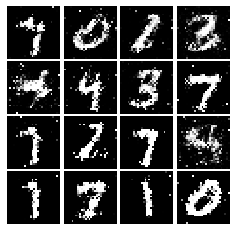

Epoch: 8, Iter: 4000, D: 1.286, G:0.8304


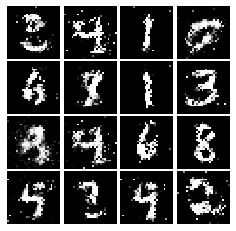

Epoch: 8, Iter: 4020, D: 1.283, G:0.769


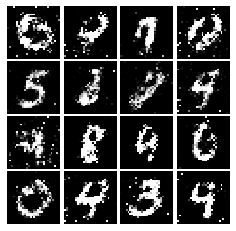

Epoch: 8, Iter: 4040, D: 1.363, G:0.8816


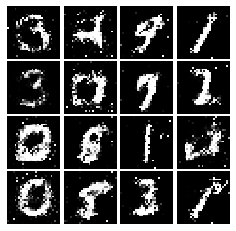

Epoch: 8, Iter: 4060, D: 1.29, G:0.7589


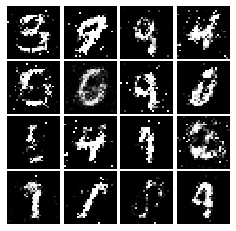

Epoch: 8, Iter: 4080, D: 1.356, G:0.8326


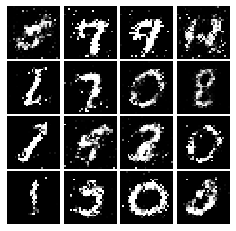

Epoch: 8, Iter: 4100, D: 1.282, G:0.8562


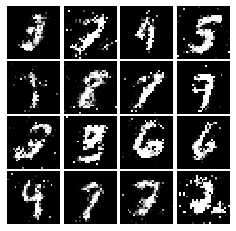

Epoch: 8, Iter: 4120, D: 1.297, G:0.8326


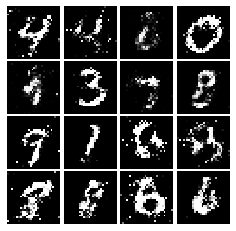

Epoch: 8, Iter: 4140, D: 1.31, G:0.9025


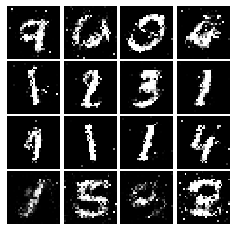

Epoch: 8, Iter: 4160, D: 1.354, G:0.8231


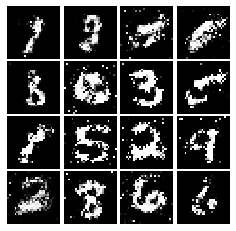

Epoch: 8, Iter: 4180, D: 1.438, G:0.8284


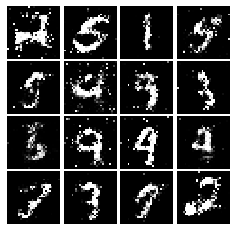

Epoch: 8, Iter: 4200, D: 1.323, G:0.8115


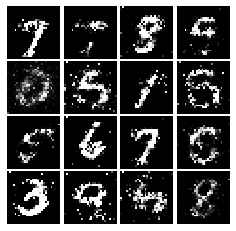

Epoch: 8, Iter: 4220, D: 1.338, G:0.9522


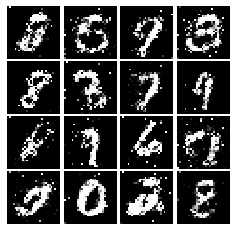

Epoch: 9, Iter: 4240, D: 1.375, G:0.7508


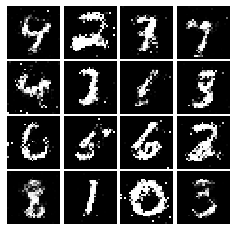

Epoch: 9, Iter: 4260, D: 1.375, G:0.738


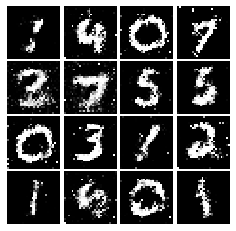

Epoch: 9, Iter: 4280, D: 1.363, G:0.7916


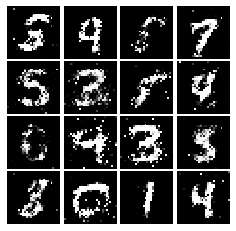

Epoch: 9, Iter: 4300, D: 1.43, G:0.7404


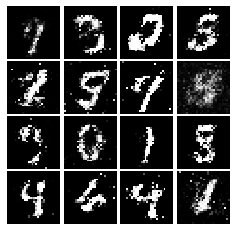

Epoch: 9, Iter: 4320, D: 1.372, G:0.8017


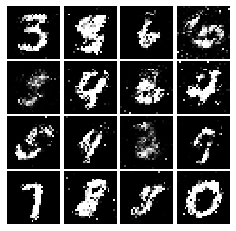

Epoch: 9, Iter: 4340, D: 1.339, G:0.8278


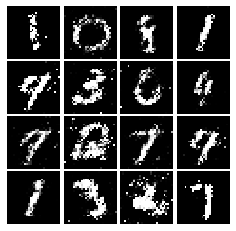

Epoch: 9, Iter: 4360, D: 1.295, G:0.7402


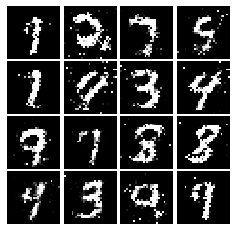

Epoch: 9, Iter: 4380, D: 1.358, G:0.8771


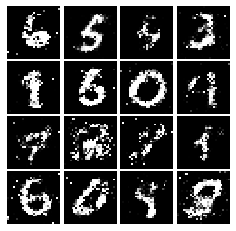

Epoch: 9, Iter: 4400, D: 1.263, G:0.8418


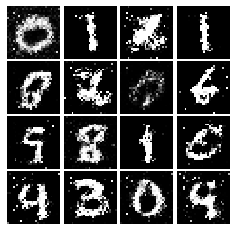

Epoch: 9, Iter: 4420, D: 1.356, G:0.7846


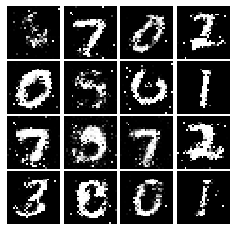

Epoch: 9, Iter: 4440, D: 1.289, G:0.7972


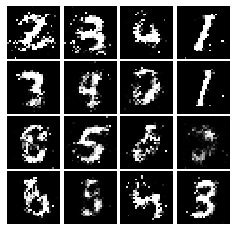

Epoch: 9, Iter: 4460, D: 1.376, G:0.8824


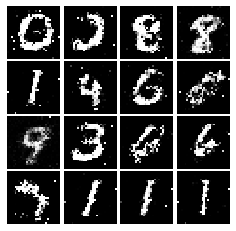

Epoch: 9, Iter: 4480, D: 1.312, G:0.7555


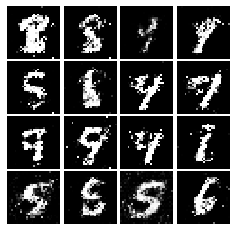

Epoch: 9, Iter: 4500, D: 1.476, G:0.8593


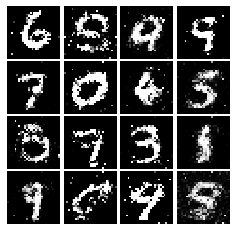

Epoch: 9, Iter: 4520, D: 1.33, G:0.73


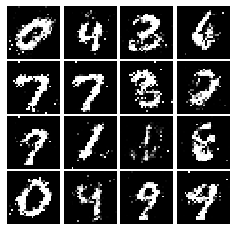

Epoch: 9, Iter: 4540, D: 1.391, G:0.7398


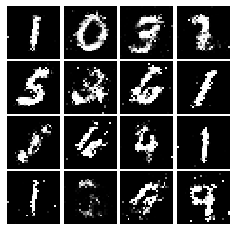

Epoch: 9, Iter: 4560, D: 1.362, G:0.8481


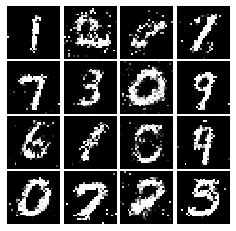

Epoch: 9, Iter: 4580, D: 1.363, G:0.8001


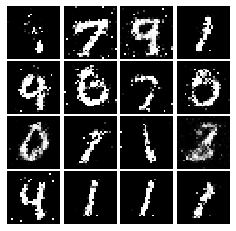

Epoch: 9, Iter: 4600, D: 1.421, G:0.8582


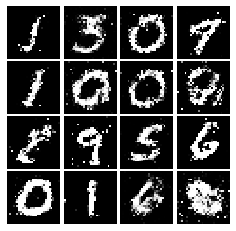

Epoch: 9, Iter: 4620, D: 1.31, G:0.7641


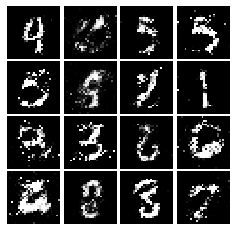

Epoch: 9, Iter: 4640, D: 1.355, G:0.721


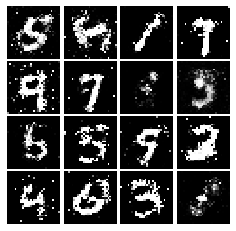

Epoch: 9, Iter: 4660, D: 1.351, G:0.8144


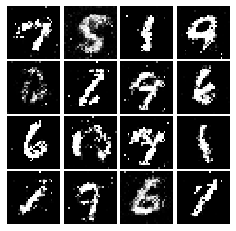

Epoch: 9, Iter: 4680, D: 1.329, G:0.8372


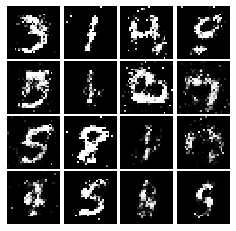

Final images


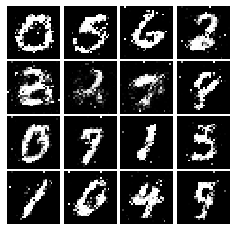

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    Dx=scores_real
    DGx=scores_fake
    loss=tf.reduce_mean(tf.math.square(Dx-1))+tf.reduce_mean(tf.math.square(DGx))
    loss/=2.0

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    DGx=scores_fake
    loss=tf.reduce_mean(tf.math.square(DGx-1))
    loss/=2.0

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.609, G:0.4183


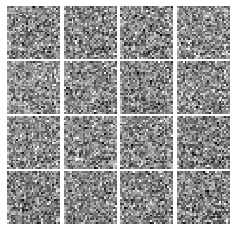

Epoch: 0, Iter: 20, D: 0.06117, G:0.9017


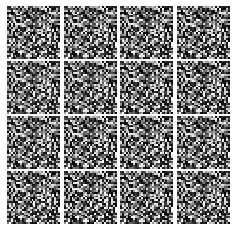

Epoch: 0, Iter: 40, D: 0.0209, G:0.9274


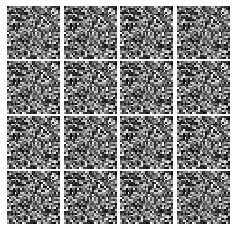

Epoch: 0, Iter: 60, D: 0.06901, G:1.249


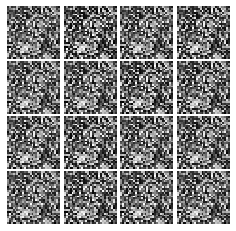

Epoch: 0, Iter: 80, D: 0.02061, G:0.6559


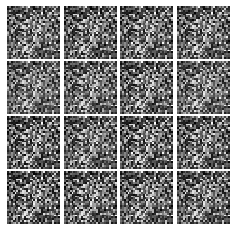

Epoch: 0, Iter: 100, D: 0.01165, G:0.5837


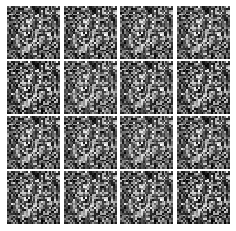

Epoch: 0, Iter: 120, D: 0.008188, G:0.5688


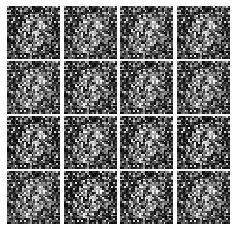

Epoch: 0, Iter: 140, D: 0.02833, G:0.5502


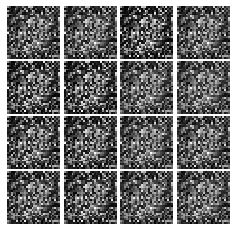

Epoch: 0, Iter: 160, D: 0.03751, G:0.6106


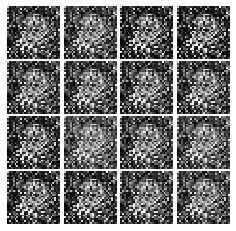

Epoch: 0, Iter: 180, D: 0.05202, G:0.3492


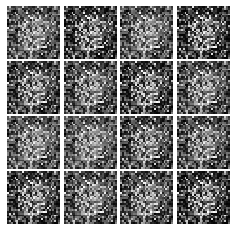

Epoch: 0, Iter: 200, D: 0.05304, G:0.6804


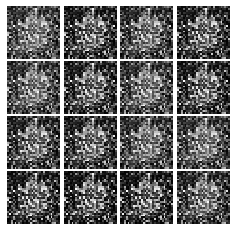

Epoch: 0, Iter: 220, D: 0.2079, G:0.6668


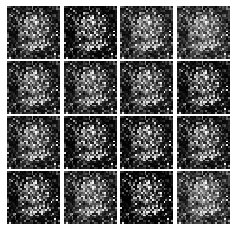

Epoch: 0, Iter: 240, D: 0.1652, G:0.4488


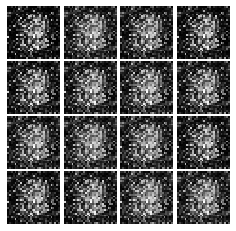

Epoch: 0, Iter: 260, D: 0.1546, G:0.3222


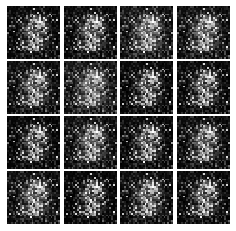

Epoch: 0, Iter: 280, D: 0.1477, G:0.4726


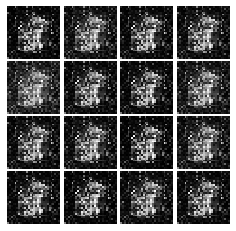

Epoch: 0, Iter: 300, D: 0.1335, G:0.4494


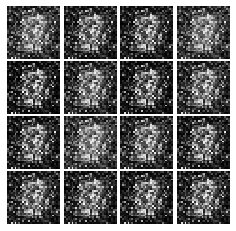

Epoch: 0, Iter: 320, D: 0.08465, G:0.3695


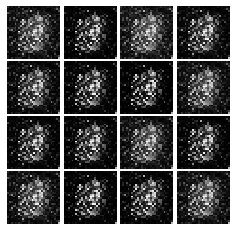

Epoch: 0, Iter: 340, D: 0.154, G:0.3741


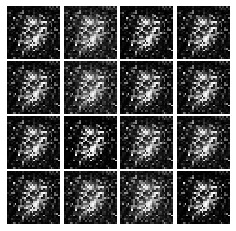

Epoch: 0, Iter: 360, D: 0.1073, G:0.3084


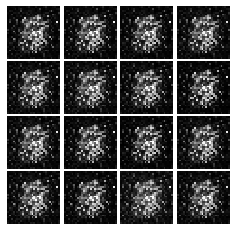

Epoch: 0, Iter: 380, D: 0.4608, G:1.226


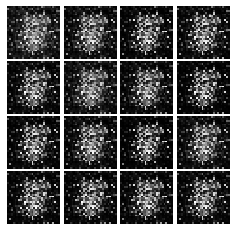

Epoch: 0, Iter: 400, D: 0.1106, G:0.7475


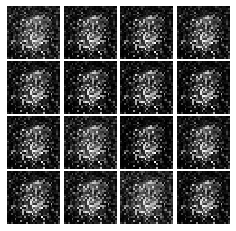

Epoch: 0, Iter: 420, D: 0.1448, G:0.3885


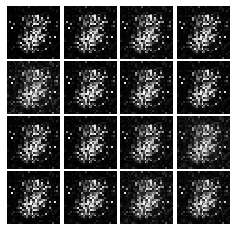

Epoch: 0, Iter: 440, D: 0.108, G:0.3635


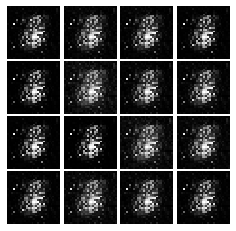

Epoch: 0, Iter: 460, D: 0.04569, G:0.458


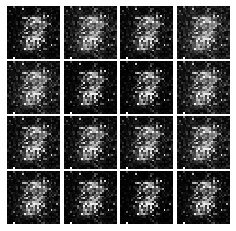

Epoch: 1, Iter: 480, D: 0.1183, G:0.2905


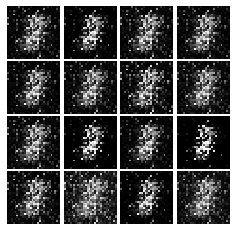

Epoch: 1, Iter: 500, D: 0.1841, G:0.9489


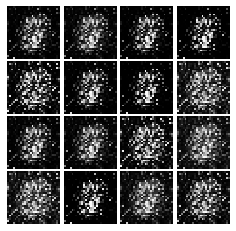

Epoch: 1, Iter: 520, D: 0.12, G:0.5446


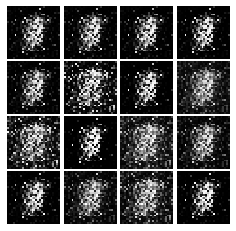

Epoch: 1, Iter: 540, D: 0.1465, G:0.2894


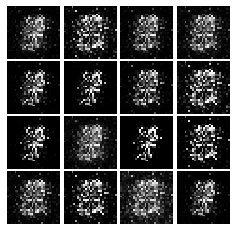

Epoch: 1, Iter: 560, D: 0.1528, G:0.3771


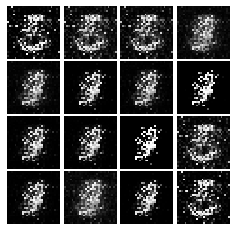

Epoch: 1, Iter: 580, D: 0.05635, G:0.6544


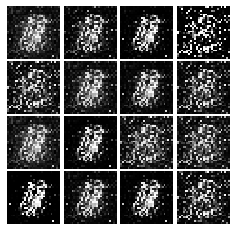

Epoch: 1, Iter: 600, D: 0.08665, G:0.3546


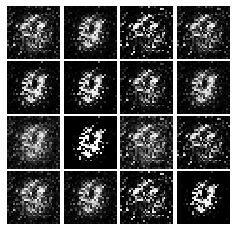

Epoch: 1, Iter: 620, D: 0.0909, G:0.3824


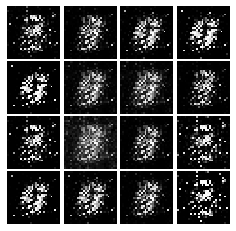

Epoch: 1, Iter: 640, D: 0.123, G:0.4746


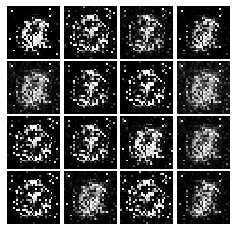

Epoch: 1, Iter: 660, D: 0.0997, G:0.4833


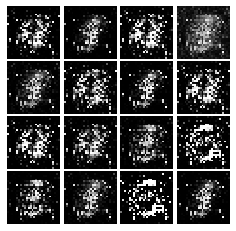

Epoch: 1, Iter: 680, D: 0.1624, G:0.5199


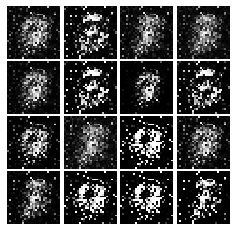

Epoch: 1, Iter: 700, D: 0.234, G:0.6657


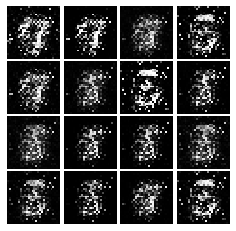

Epoch: 1, Iter: 720, D: 0.1111, G:0.3101


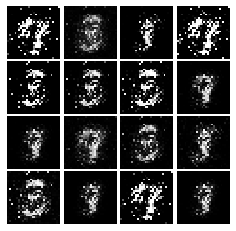

Epoch: 1, Iter: 740, D: 0.1296, G:0.3654


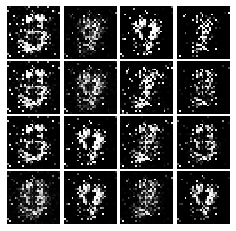

Epoch: 1, Iter: 760, D: 0.1913, G:0.2558


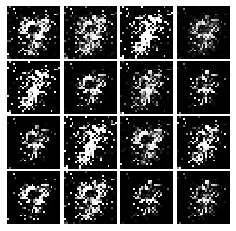

Epoch: 1, Iter: 780, D: 0.2115, G:0.7421


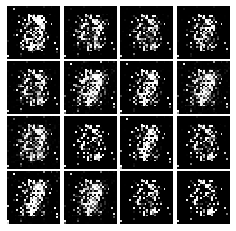

Epoch: 1, Iter: 800, D: 0.1158, G:0.3372


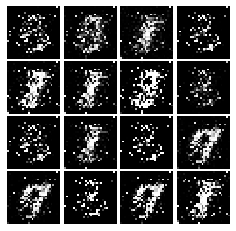

Epoch: 1, Iter: 820, D: 0.1387, G:0.5099


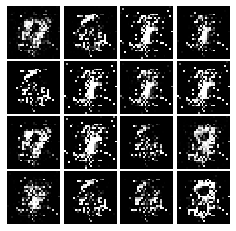

Epoch: 1, Iter: 840, D: 0.09051, G:0.4308


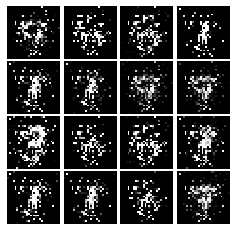

Epoch: 1, Iter: 860, D: 0.1285, G:0.3463


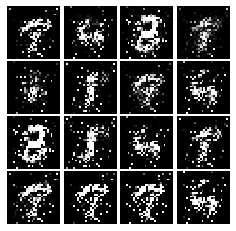

Epoch: 1, Iter: 880, D: 0.1149, G:0.4179


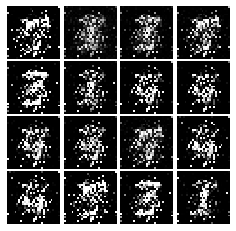

Epoch: 1, Iter: 900, D: 0.104, G:1.552


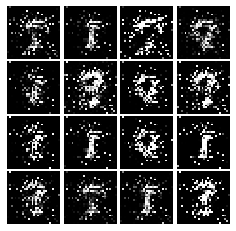

Epoch: 1, Iter: 920, D: 0.1492, G:0.3127


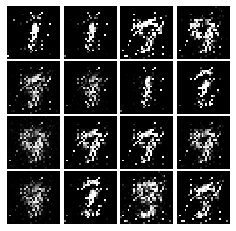

Epoch: 2, Iter: 940, D: 0.1211, G:0.3285


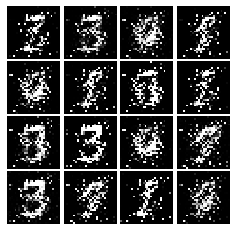

Epoch: 2, Iter: 960, D: 0.1378, G:0.4532


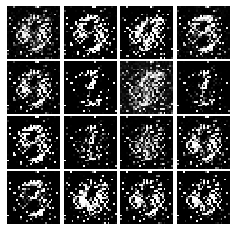

Epoch: 2, Iter: 980, D: 0.2431, G:0.6638


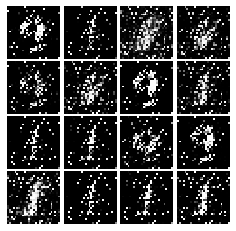

Epoch: 2, Iter: 1000, D: 0.09844, G:0.5608


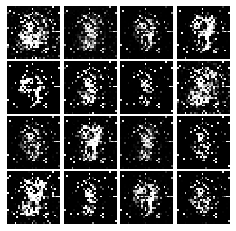

Epoch: 2, Iter: 1020, D: 0.1531, G:0.3931


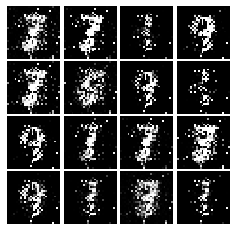

Epoch: 2, Iter: 1040, D: 0.1767, G:0.4829


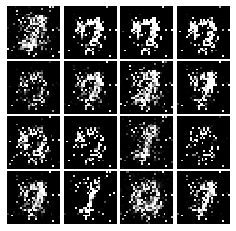

Epoch: 2, Iter: 1060, D: 0.1448, G:0.2773


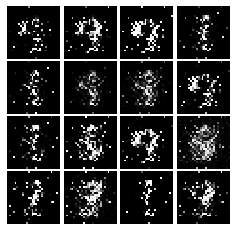

Epoch: 2, Iter: 1080, D: 0.1918, G:0.2023


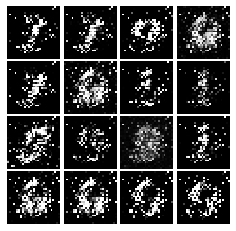

Epoch: 2, Iter: 1100, D: 0.181, G:1.537


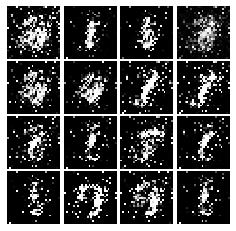

Epoch: 2, Iter: 1120, D: 0.1612, G:0.2379


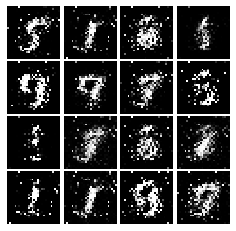

Epoch: 2, Iter: 1140, D: 0.1589, G:0.4411


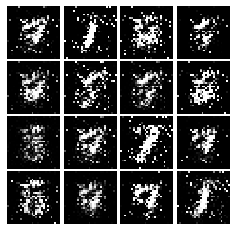

Epoch: 2, Iter: 1160, D: 0.2019, G:0.2283


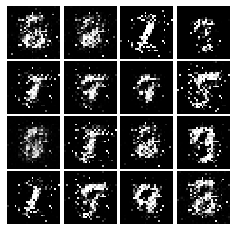

Epoch: 2, Iter: 1180, D: 0.1571, G:0.2623


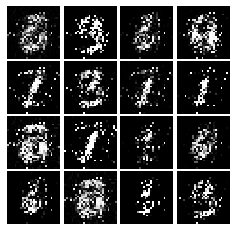

Epoch: 2, Iter: 1200, D: 0.27, G:0.5961


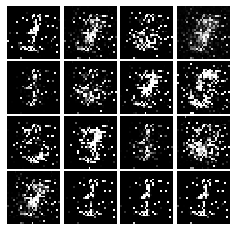

Epoch: 2, Iter: 1220, D: 0.1641, G:0.2685


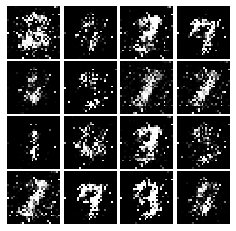

Epoch: 2, Iter: 1240, D: 0.1488, G:0.1379


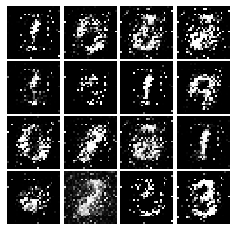

Epoch: 2, Iter: 1260, D: 0.1872, G:0.2616


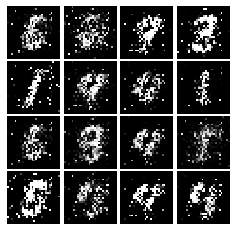

Epoch: 2, Iter: 1280, D: 0.1811, G:0.1867


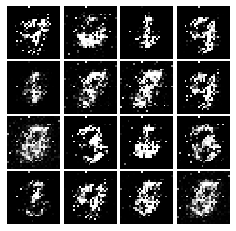

Epoch: 2, Iter: 1300, D: 0.1572, G:0.36


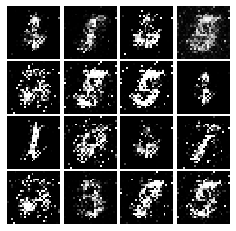

Epoch: 2, Iter: 1320, D: 0.1663, G:0.2292


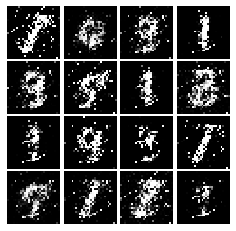

Epoch: 2, Iter: 1340, D: 0.1603, G:0.3389


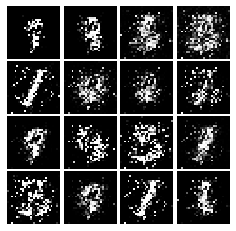

Epoch: 2, Iter: 1360, D: 0.1507, G:0.3313


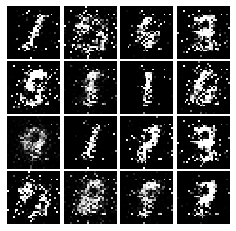

Epoch: 2, Iter: 1380, D: 0.1811, G:0.3075


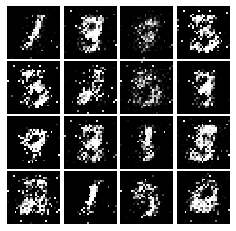

Epoch: 2, Iter: 1400, D: 0.1719, G:0.2173


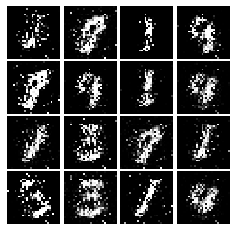

Epoch: 3, Iter: 1420, D: 0.2081, G:0.5115


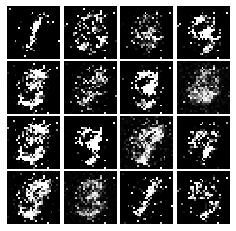

Epoch: 3, Iter: 1440, D: 0.1732, G:0.2536


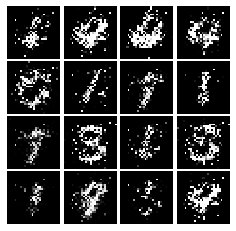

Epoch: 3, Iter: 1460, D: 0.194, G:0.3973


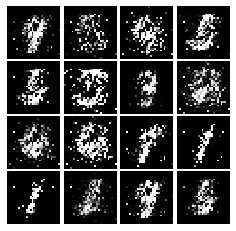

Epoch: 3, Iter: 1480, D: 0.2028, G:0.2071


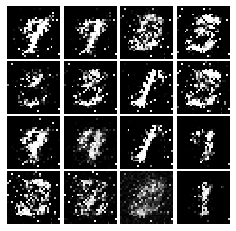

Epoch: 3, Iter: 1500, D: 0.1998, G:0.08537


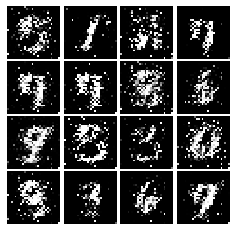

Epoch: 3, Iter: 1520, D: 0.2061, G:0.2112


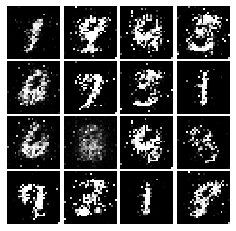

Epoch: 3, Iter: 1540, D: 0.1948, G:0.2469


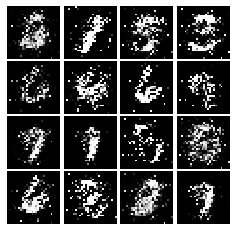

Epoch: 3, Iter: 1560, D: 0.1874, G:0.2211


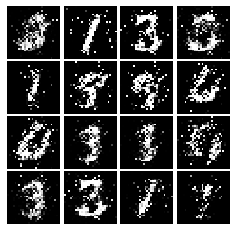

Epoch: 3, Iter: 1580, D: 0.2071, G:0.5801


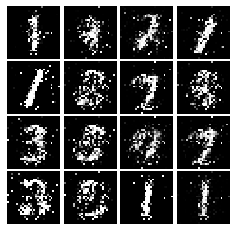

Epoch: 3, Iter: 1600, D: 0.1912, G:0.2341


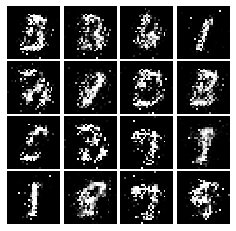

Epoch: 3, Iter: 1620, D: 0.205, G:0.472


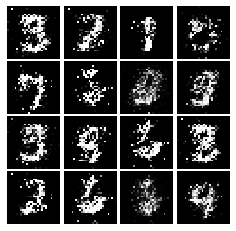

Epoch: 3, Iter: 1640, D: 0.2249, G:0.1897


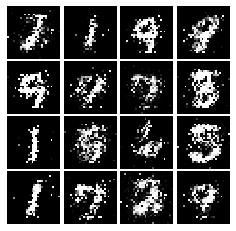

Epoch: 3, Iter: 1660, D: 0.2018, G:0.2128


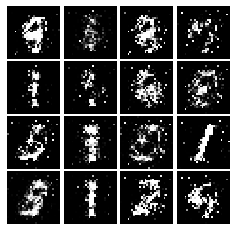

Epoch: 3, Iter: 1680, D: 0.1921, G:0.3387


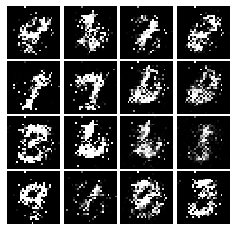

Epoch: 3, Iter: 1700, D: 0.2012, G:0.1115


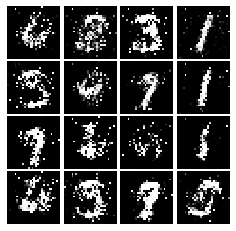

Epoch: 3, Iter: 1720, D: 0.1804, G:0.247


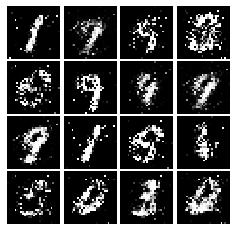

Epoch: 3, Iter: 1740, D: 0.1921, G:0.2644


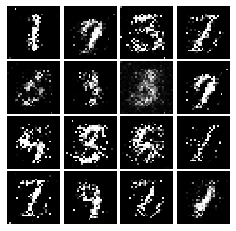

Epoch: 3, Iter: 1760, D: 0.1874, G:0.2473


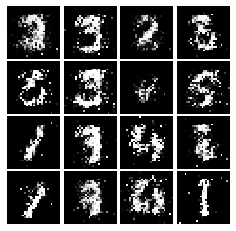

Epoch: 3, Iter: 1780, D: 0.1766, G:0.2341


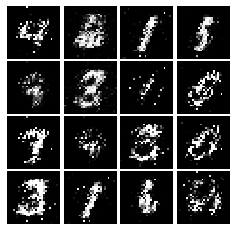

Epoch: 3, Iter: 1800, D: 0.2396, G:0.1565


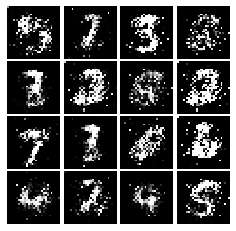

Epoch: 3, Iter: 1820, D: 0.2241, G:0.1785


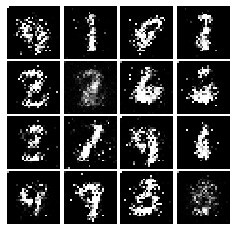

Epoch: 3, Iter: 1840, D: 0.2127, G:0.1964


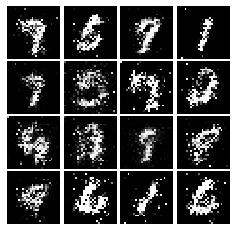

Epoch: 3, Iter: 1860, D: 0.2444, G:0.2148


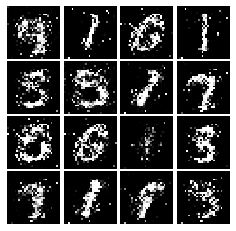

Epoch: 4, Iter: 1880, D: 0.2287, G:0.2171


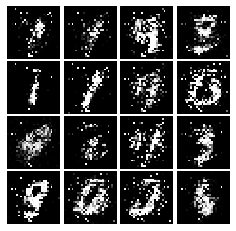

Epoch: 4, Iter: 1900, D: 0.227, G:0.2261


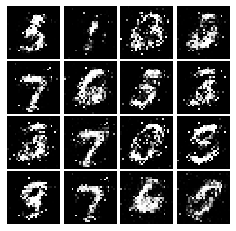

Epoch: 4, Iter: 1920, D: 0.1951, G:0.222


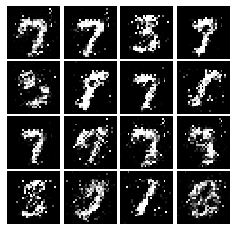

Epoch: 4, Iter: 1940, D: 0.2036, G:0.2204


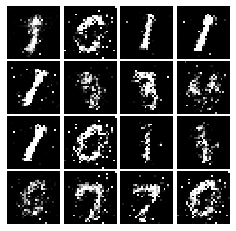

Epoch: 4, Iter: 1960, D: 0.2023, G:0.2097


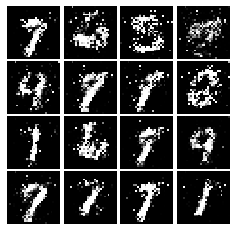

Epoch: 4, Iter: 1980, D: 0.1982, G:0.2069


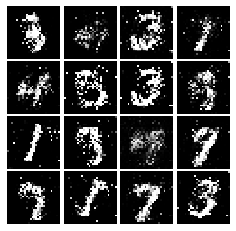

Epoch: 4, Iter: 2000, D: 0.2571, G:0.2048


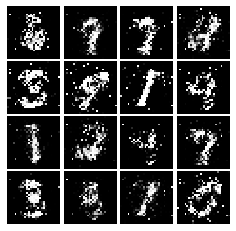

Epoch: 4, Iter: 2020, D: 0.1905, G:0.2091


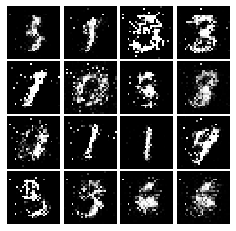

Epoch: 4, Iter: 2040, D: 0.2322, G:0.2021


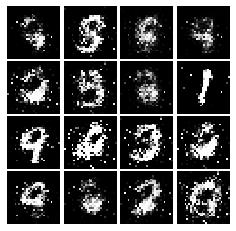

Epoch: 4, Iter: 2060, D: 0.2325, G:0.2115


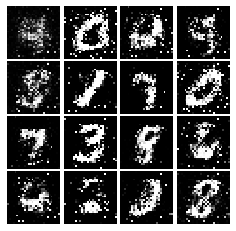

Epoch: 4, Iter: 2080, D: 0.2487, G:0.1789


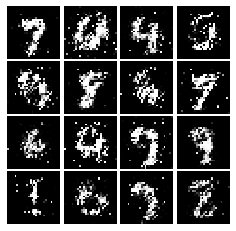

Epoch: 4, Iter: 2100, D: 0.1915, G:0.2005


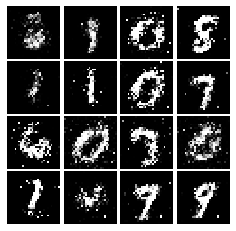

Epoch: 4, Iter: 2120, D: 0.2365, G:0.1939


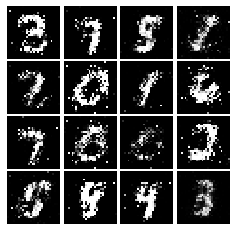

Epoch: 4, Iter: 2140, D: 0.2435, G:0.1852


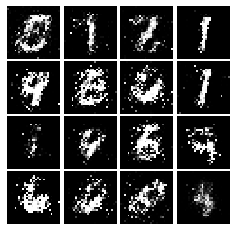

Epoch: 4, Iter: 2160, D: 0.2402, G:0.1644


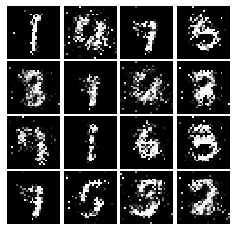

Epoch: 4, Iter: 2180, D: 0.1975, G:0.2423


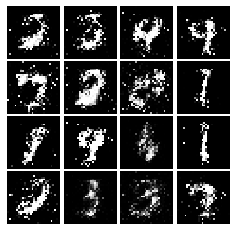

Epoch: 4, Iter: 2200, D: 0.2088, G:0.2007


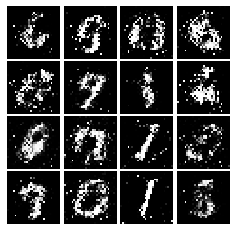

Epoch: 4, Iter: 2220, D: 0.2065, G:0.2196


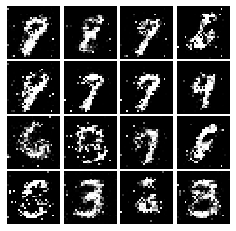

Epoch: 4, Iter: 2240, D: 0.2256, G:0.2884


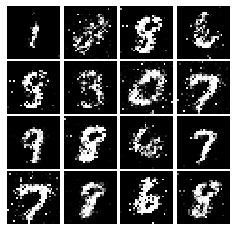

Epoch: 4, Iter: 2260, D: 0.2147, G:0.2052


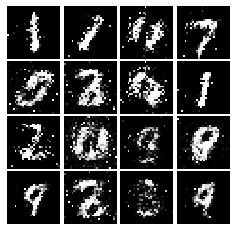

Epoch: 4, Iter: 2280, D: 0.2238, G:0.1881


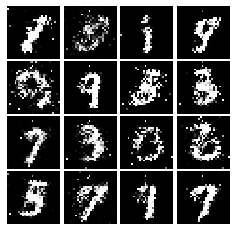

Epoch: 4, Iter: 2300, D: 0.2123, G:0.1789


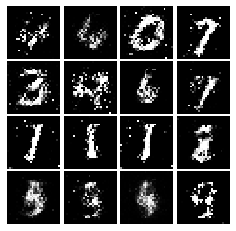

Epoch: 4, Iter: 2320, D: 0.2337, G:0.191


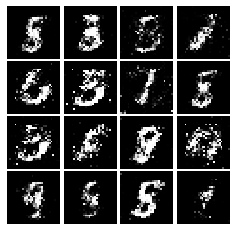

Epoch: 4, Iter: 2340, D: 0.1963, G:0.2374


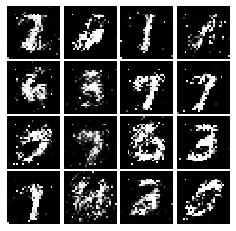

Epoch: 5, Iter: 2360, D: 0.2185, G:0.1674


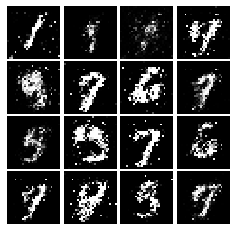

Epoch: 5, Iter: 2380, D: 0.2191, G:0.154


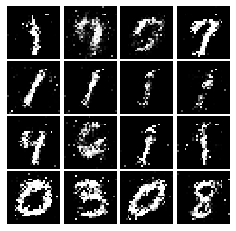

Epoch: 5, Iter: 2400, D: 0.2049, G:0.2907


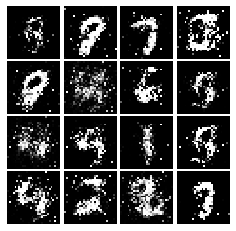

Epoch: 5, Iter: 2420, D: 0.2252, G:0.1884


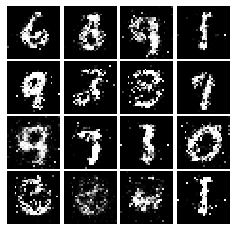

Epoch: 5, Iter: 2440, D: 0.2314, G:0.1742


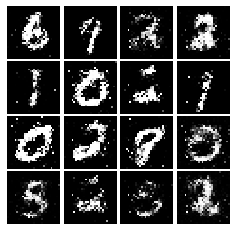

Epoch: 5, Iter: 2460, D: 0.208, G:0.2406


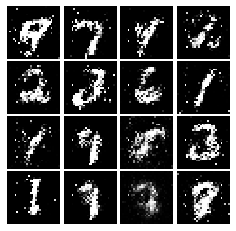

Epoch: 5, Iter: 2480, D: 0.1982, G:0.173


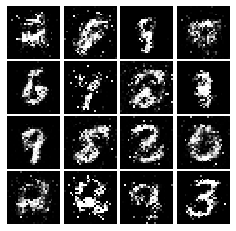

Epoch: 5, Iter: 2500, D: 0.2098, G:0.1857


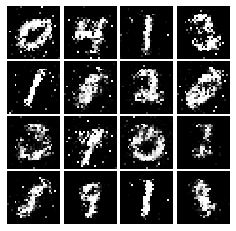

Epoch: 5, Iter: 2520, D: 0.235, G:0.1596


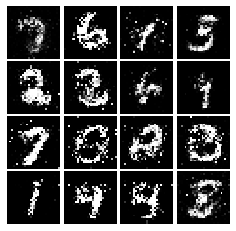

Epoch: 5, Iter: 2540, D: 0.2182, G:0.1846


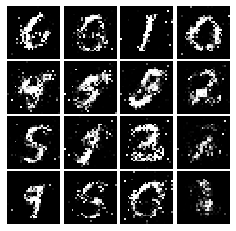

Epoch: 5, Iter: 2560, D: 0.2228, G:0.1885


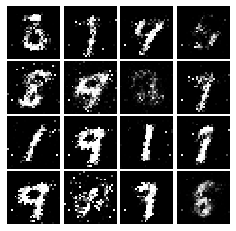

Epoch: 5, Iter: 2580, D: 0.2512, G:0.213


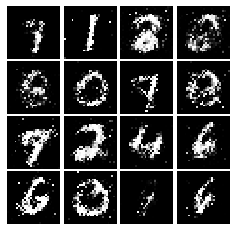

Epoch: 5, Iter: 2600, D: 0.2793, G:0.1738


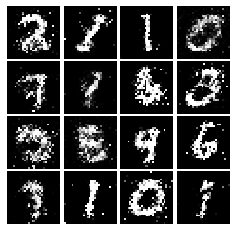

Epoch: 5, Iter: 2620, D: 0.2407, G:0.1716


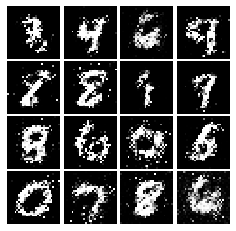

Epoch: 5, Iter: 2640, D: 0.2053, G:0.1787


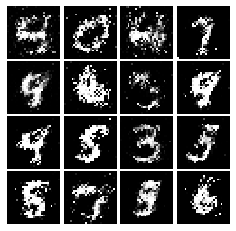

Epoch: 5, Iter: 2660, D: 0.2037, G:0.194


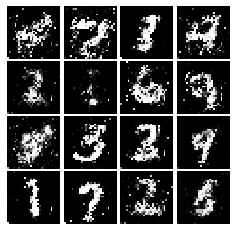

Epoch: 5, Iter: 2680, D: 0.2292, G:0.1689


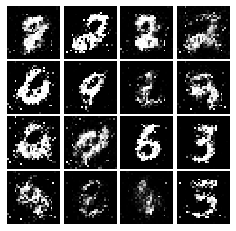

Epoch: 5, Iter: 2700, D: 0.2402, G:0.1725


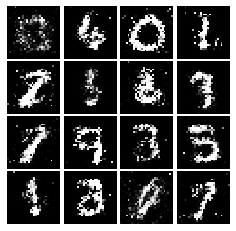

Epoch: 5, Iter: 2720, D: 0.2271, G:0.1736


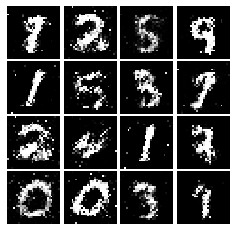

Epoch: 5, Iter: 2740, D: 0.2227, G:0.1659


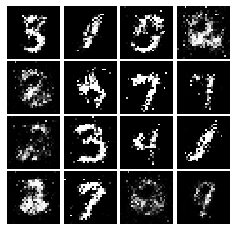

Epoch: 5, Iter: 2760, D: 0.2289, G:0.1642


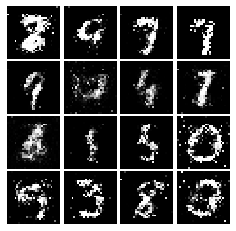

Epoch: 5, Iter: 2780, D: 0.214, G:0.1692


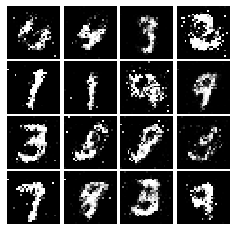

Epoch: 5, Iter: 2800, D: 0.1984, G:0.1733


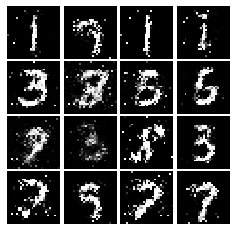

Epoch: 6, Iter: 2820, D: 0.2282, G:0.1598


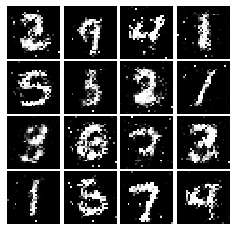

Epoch: 6, Iter: 2840, D: 0.213, G:0.1754


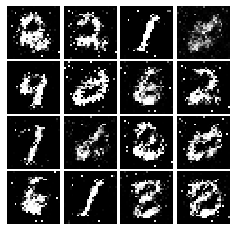

Epoch: 6, Iter: 2860, D: 0.2011, G:0.1931


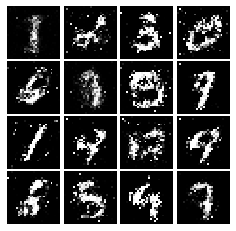

Epoch: 6, Iter: 2880, D: 0.1882, G:0.2131


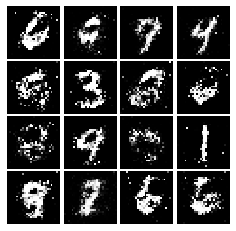

Epoch: 6, Iter: 2900, D: 0.2237, G:0.1986


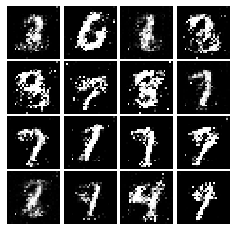

Epoch: 6, Iter: 2920, D: 0.2418, G:0.1756


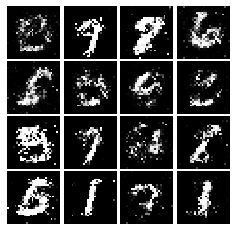

Epoch: 6, Iter: 2940, D: 0.218, G:0.1679


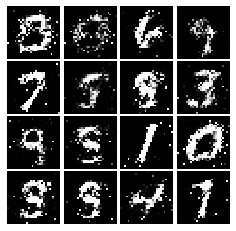

Epoch: 6, Iter: 2960, D: 0.2365, G:0.1629


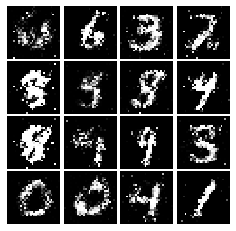

Epoch: 6, Iter: 2980, D: 0.2543, G:0.1618


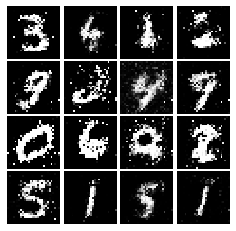

Epoch: 6, Iter: 3000, D: 0.2268, G:0.1801


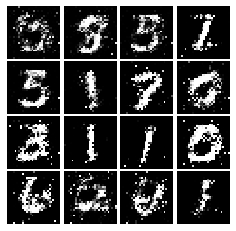

Epoch: 6, Iter: 3020, D: 0.2311, G:0.1627


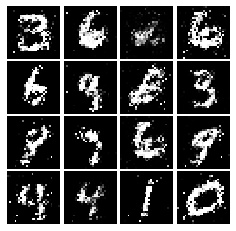

Epoch: 6, Iter: 3040, D: 0.2258, G:0.2071


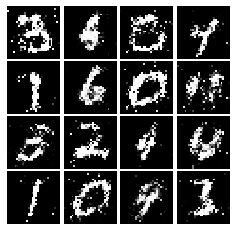

Epoch: 6, Iter: 3060, D: 0.2273, G:0.1584


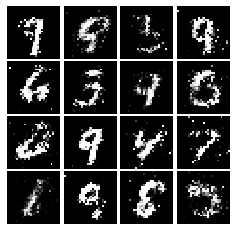

Epoch: 6, Iter: 3080, D: 0.2101, G:0.1993


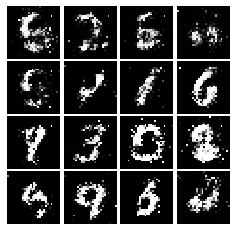

Epoch: 6, Iter: 3100, D: 0.1961, G:0.2295


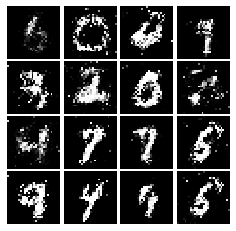

Epoch: 6, Iter: 3120, D: 0.2253, G:0.2041


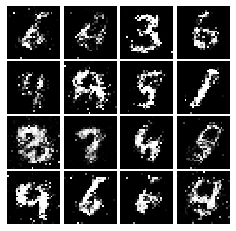

Epoch: 6, Iter: 3140, D: 0.2379, G:0.1872


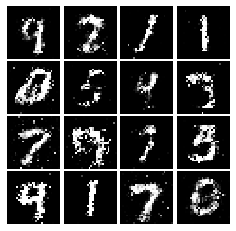

Epoch: 6, Iter: 3160, D: 0.2158, G:0.1711


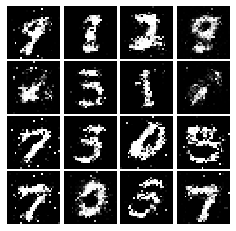

Epoch: 6, Iter: 3180, D: 0.227, G:0.1974


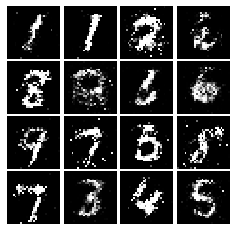

Epoch: 6, Iter: 3200, D: 0.248, G:0.1848


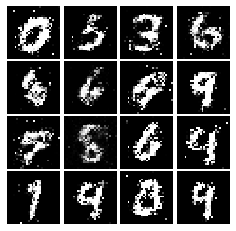

Epoch: 6, Iter: 3220, D: 0.2102, G:0.1782


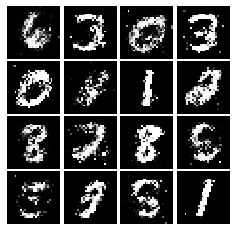

Epoch: 6, Iter: 3240, D: 0.2245, G:0.1671


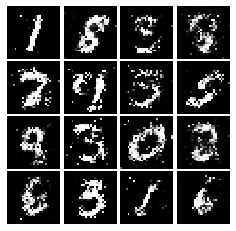

Epoch: 6, Iter: 3260, D: 0.2472, G:0.1797


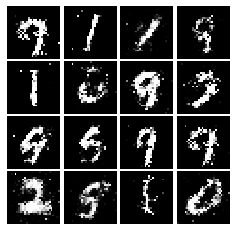

Epoch: 6, Iter: 3280, D: 0.2253, G:0.2073


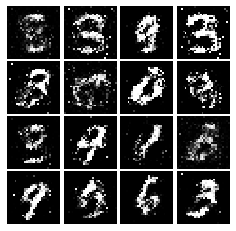

Epoch: 7, Iter: 3300, D: 0.2188, G:0.1608


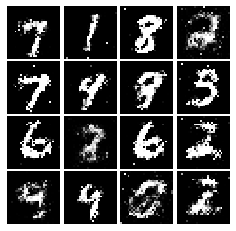

Epoch: 7, Iter: 3320, D: 0.22, G:0.1684


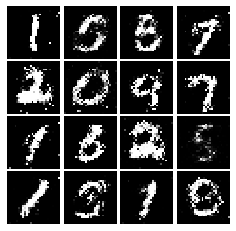

Epoch: 7, Iter: 3340, D: 0.2304, G:0.1838


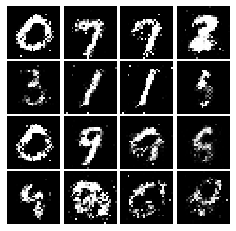

Epoch: 7, Iter: 3360, D: 0.2502, G:0.1736


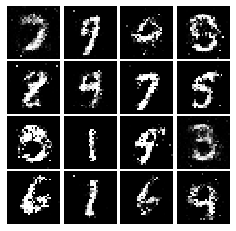

Epoch: 7, Iter: 3380, D: 0.2414, G:0.1649


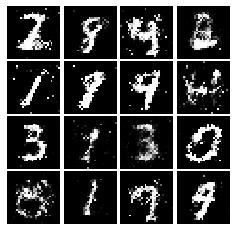

Epoch: 7, Iter: 3400, D: 0.2518, G:0.1604


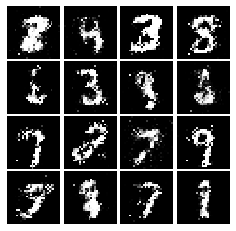

Epoch: 7, Iter: 3420, D: 0.2387, G:0.1845


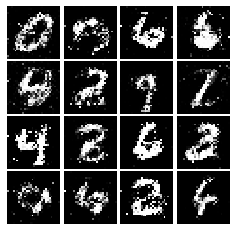

Epoch: 7, Iter: 3440, D: 0.2351, G:0.1728


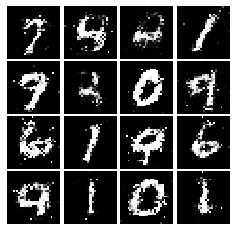

Epoch: 7, Iter: 3460, D: 0.2167, G:0.1738


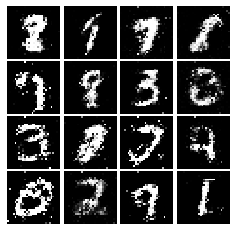

Epoch: 7, Iter: 3480, D: 0.2332, G:0.1563


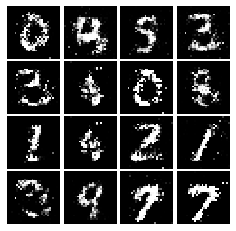

Epoch: 7, Iter: 3500, D: 0.2411, G:0.1778


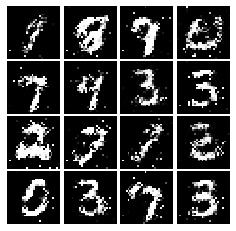

Epoch: 7, Iter: 3520, D: 0.2633, G:0.1445


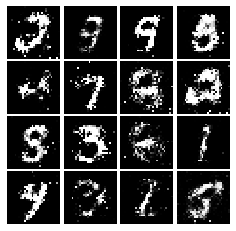

Epoch: 7, Iter: 3540, D: 0.2355, G:0.1627


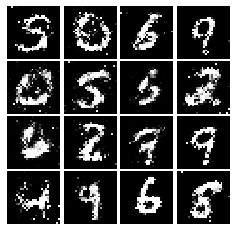

Epoch: 7, Iter: 3560, D: 0.2176, G:0.1821


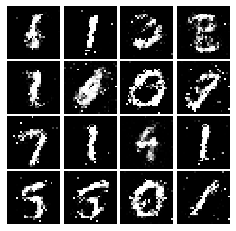

Epoch: 7, Iter: 3580, D: 0.2381, G:0.1474


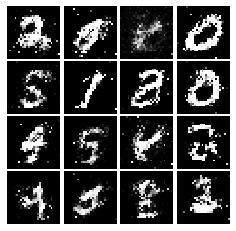

Epoch: 7, Iter: 3600, D: 0.2252, G:0.1485


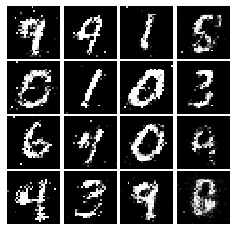

Epoch: 7, Iter: 3620, D: 0.2241, G:0.1601


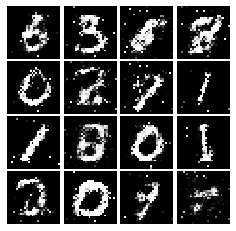

Epoch: 7, Iter: 3640, D: 0.2522, G:0.1727


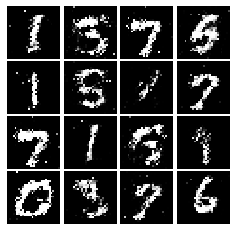

Epoch: 7, Iter: 3660, D: 0.225, G:0.17


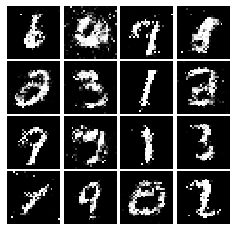

Epoch: 7, Iter: 3680, D: 0.2522, G:0.1607


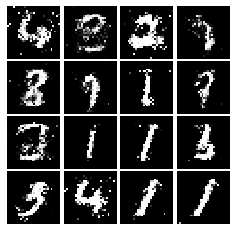

Epoch: 7, Iter: 3700, D: 0.2271, G:0.186


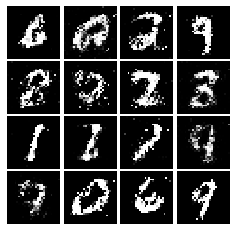

Epoch: 7, Iter: 3720, D: 0.2434, G:0.1794


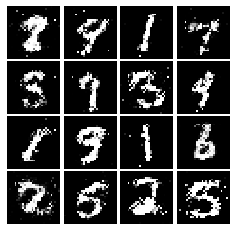

Epoch: 7, Iter: 3740, D: 0.2461, G:0.1574


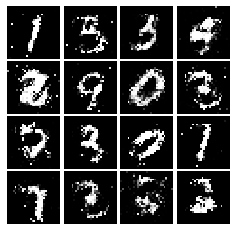

Epoch: 8, Iter: 3760, D: 0.2654, G:0.1611


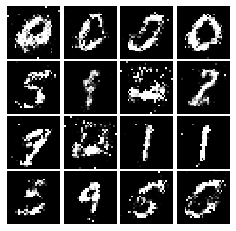

Epoch: 8, Iter: 3780, D: 0.2517, G:0.1432


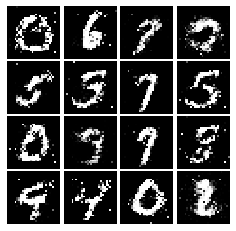

Epoch: 8, Iter: 3800, D: 0.2303, G:0.1731


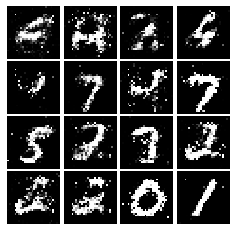

Epoch: 8, Iter: 3820, D: 0.2461, G:0.1813


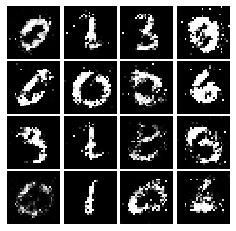

Epoch: 8, Iter: 3840, D: 0.2341, G:0.1505


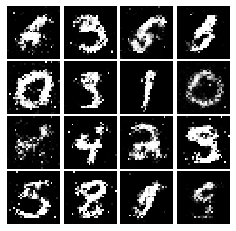

Epoch: 8, Iter: 3860, D: 0.2473, G:0.1726


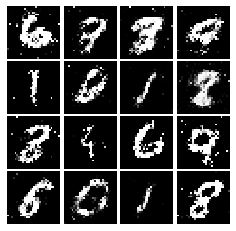

Epoch: 8, Iter: 3880, D: 0.2362, G:0.1485


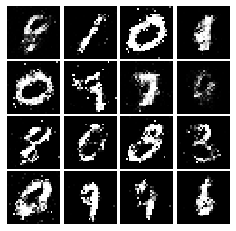

Epoch: 8, Iter: 3900, D: 0.2538, G:0.1526


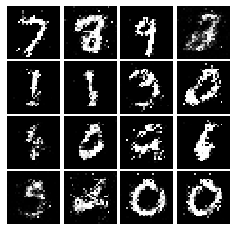

Epoch: 8, Iter: 3920, D: 0.2417, G:0.1581


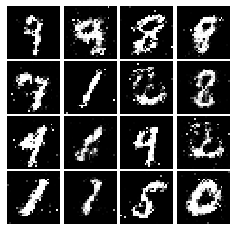

Epoch: 8, Iter: 3940, D: 0.2454, G:0.1744


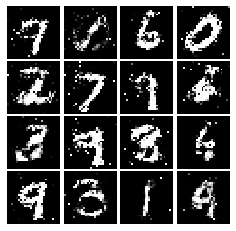

Epoch: 8, Iter: 3960, D: 0.2474, G:0.1612


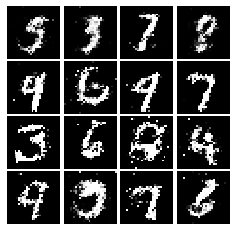

Epoch: 8, Iter: 3980, D: 0.224, G:0.1628


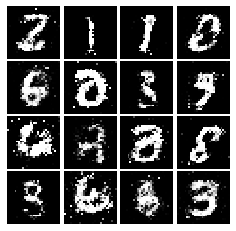

Epoch: 8, Iter: 4000, D: 0.2318, G:0.1548


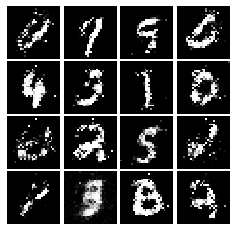

Epoch: 8, Iter: 4020, D: 0.238, G:0.148


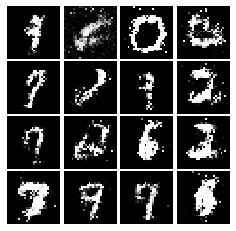

Epoch: 8, Iter: 4040, D: 0.2224, G:0.1619


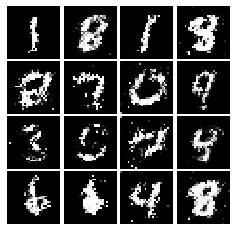

Epoch: 8, Iter: 4060, D: 0.2278, G:0.1664


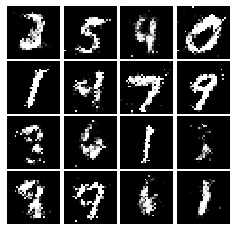

Epoch: 8, Iter: 4080, D: 0.2675, G:0.1334


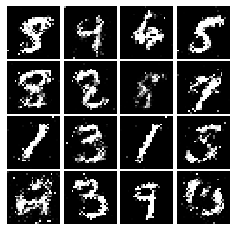

Epoch: 8, Iter: 4100, D: 0.2331, G:0.1479


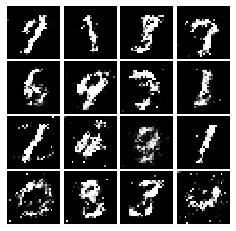

Epoch: 8, Iter: 4120, D: 0.2284, G:0.1756


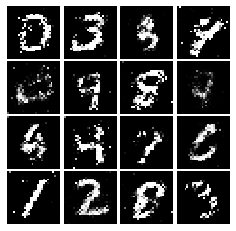

Epoch: 8, Iter: 4140, D: 0.2348, G:0.1379


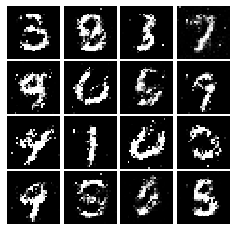

Epoch: 8, Iter: 4160, D: 0.2318, G:0.1597


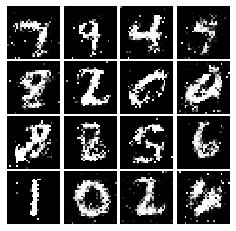

Epoch: 8, Iter: 4180, D: 0.2309, G:0.1708


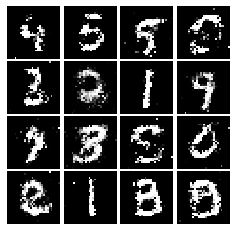

Epoch: 8, Iter: 4200, D: 0.2292, G:0.1602


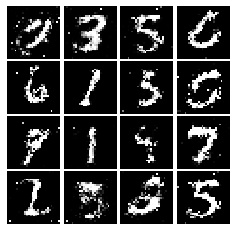

Epoch: 8, Iter: 4220, D: 0.2399, G:0.2104


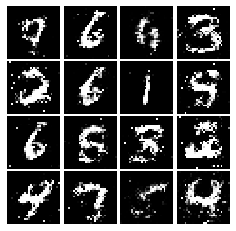

Epoch: 9, Iter: 4240, D: 0.247, G:0.1571


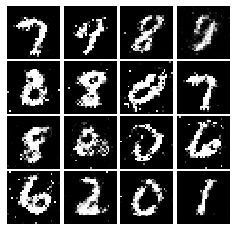

Epoch: 9, Iter: 4260, D: 0.2459, G:0.1589


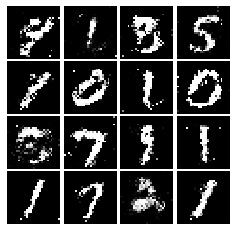

Epoch: 9, Iter: 4280, D: 0.2422, G:0.1775


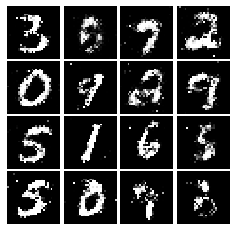

Epoch: 9, Iter: 4300, D: 0.249, G:0.149


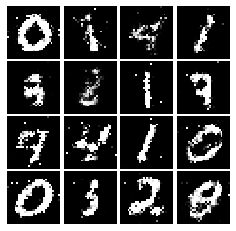

Epoch: 9, Iter: 4320, D: 0.2519, G:0.1743


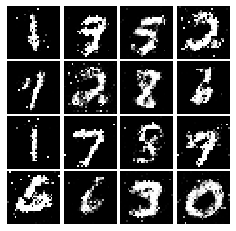

Epoch: 9, Iter: 4340, D: 0.2294, G:0.151


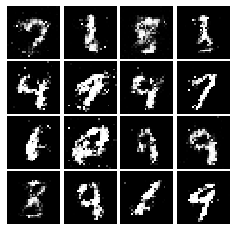

Epoch: 9, Iter: 4360, D: 0.2402, G:0.1804


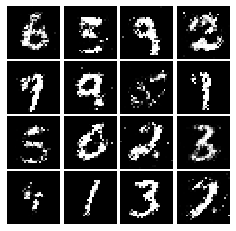

Epoch: 9, Iter: 4380, D: 0.2422, G:0.1612


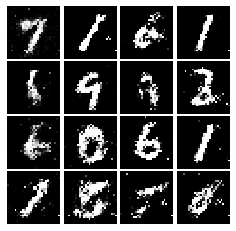

Epoch: 9, Iter: 4400, D: 0.2056, G:0.1852


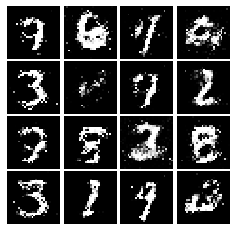

Epoch: 9, Iter: 4420, D: 0.2378, G:0.151


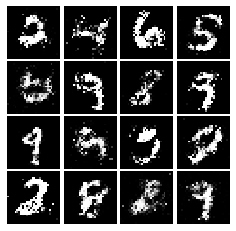

Epoch: 9, Iter: 4440, D: 0.2418, G:0.1717


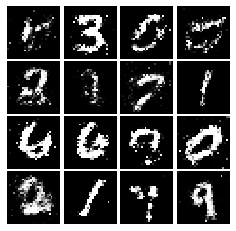

Epoch: 9, Iter: 4460, D: 0.2566, G:0.1688


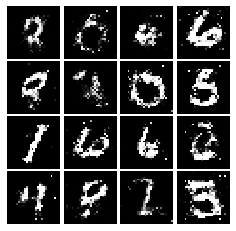

Epoch: 9, Iter: 4480, D: 0.2282, G:0.1723


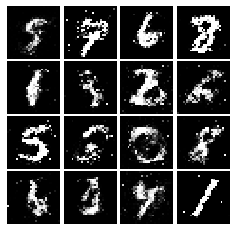

Epoch: 9, Iter: 4500, D: 0.2514, G:0.156


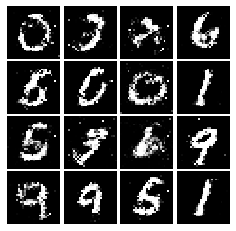

Epoch: 9, Iter: 4520, D: 0.2362, G:0.1571


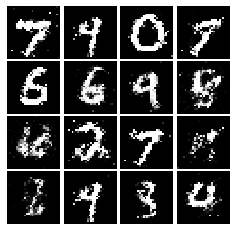

Epoch: 9, Iter: 4540, D: 0.243, G:0.1512


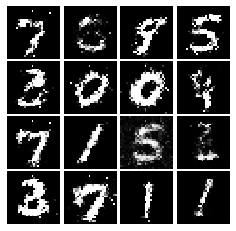

Epoch: 9, Iter: 4560, D: 0.2185, G:0.1518


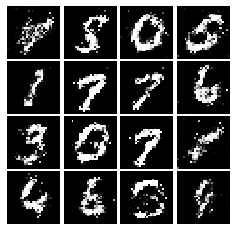

Epoch: 9, Iter: 4580, D: 0.2121, G:0.1795


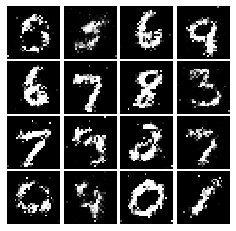

Epoch: 9, Iter: 4600, D: 0.2517, G:0.169


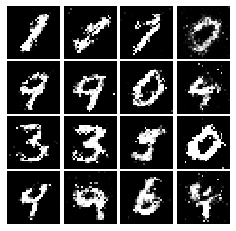

Epoch: 9, Iter: 4620, D: 0.229, G:0.1647


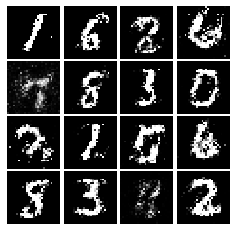

Epoch: 9, Iter: 4640, D: 0.241, G:0.1829


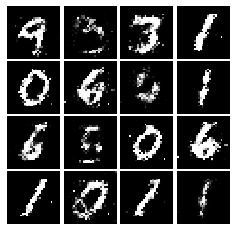

Epoch: 9, Iter: 4660, D: 0.2235, G:0.1634


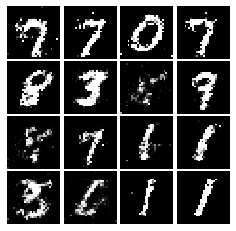

Epoch: 9, Iter: 4680, D: 0.2372, G:0.1391


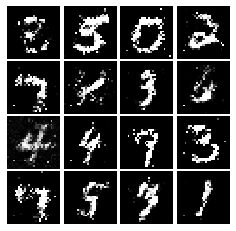

Final images


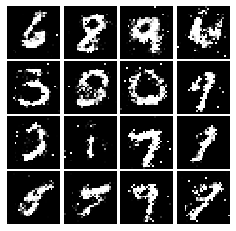

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [44]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1), input_shape=(784,)),
        tf.keras.layers.Conv2D(filters=32,kernel_size=(5,5),padding='valid',
                               activation=tf.keras.layers.LeakyReLU(alpha=0.01),strides=1),
        tf.keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='valid'),
        
        tf.keras.layers.Conv2D(filters=64,kernel_size=(5,5),
                              padding='valid',activation=tf.keras.layers.LeakyReLU(alpha=0.01),strides=1),
        tf.keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='valid'),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024,activation=tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
model.summary()
test_discriminator(1102721)

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_3 (Reshape)          (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 24, 24, 32)        832       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 12, 12, 32)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 8, 8, 64)          51264     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 4, 4, 64)          0         
_________________________________________________________________
flatten_10 (Flatten)         (None, 1024)              0         
_________________________________________________________________
dense_39 (Dense)             (None, 1024)            

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [47]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model.add(tf.keras.layers.Dense(1024,activation='relu',input_shape=(noise_dim,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(6272,activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7,7,128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),padding='same',strides=2,activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),padding='same',strides=2,activation='tanh'))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
model=generator()
model.summary()
test_generator(6595521)

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_51 (Dense)             (None, 1024)              99328     
_________________________________________________________________
batch_normalization_12 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_52 (Dense)             (None, 6272)              6428800   
_________________________________________________________________
batch_normalization_13 (Batc (None, 6272)              25088     
_________________________________________________________________
reshape_9 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_8 (Conv2DTr (None, 14, 14, 64)        131136    
_________________________________________________________________
batch_normalization_14 (Batc (None, 14, 14, 64)      

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

(60000, 28, 28)
Epoch: 0, Iter: 0, D: 1.312, G:0.6501


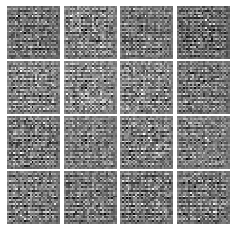

Epoch: 0, Iter: 20, D: 2.255, G:0.8971


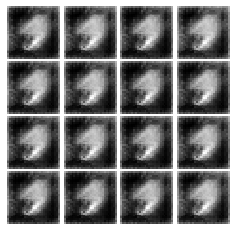

Epoch: 0, Iter: 40, D: 0.2961, G:2.083


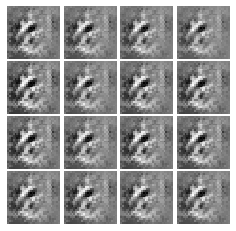

Epoch: 0, Iter: 60, D: 0.3805, G:2.908


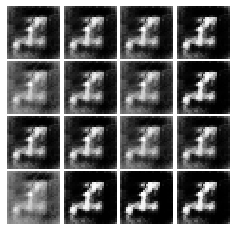

Epoch: 0, Iter: 80, D: 0.1446, G:3.628


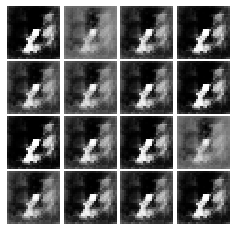

Epoch: 0, Iter: 100, D: 0.2516, G:2.616


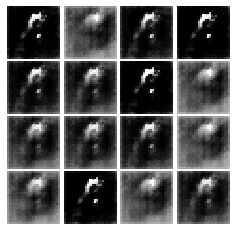

Epoch: 0, Iter: 120, D: 0.2556, G:2.949


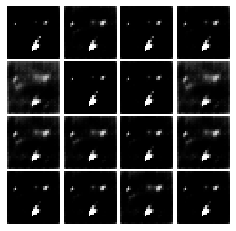

Epoch: 0, Iter: 140, D: 0.2839, G:9.998


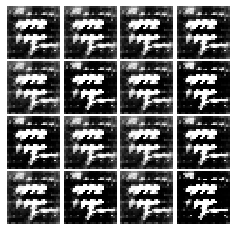

Epoch: 0, Iter: 160, D: 0.07195, G:4.485


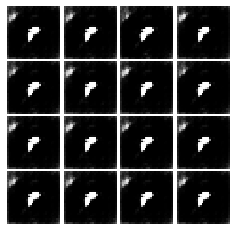

Epoch: 0, Iter: 180, D: 0.6804, G:1.792


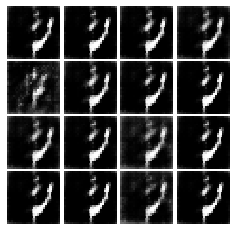

Epoch: 0, Iter: 200, D: 0.5958, G:1.939


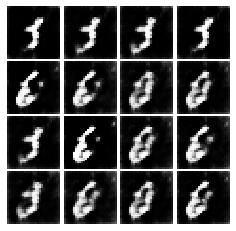

Epoch: 0, Iter: 220, D: 0.5911, G:1.851


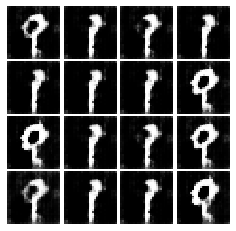

Epoch: 0, Iter: 240, D: 0.4847, G:2.631


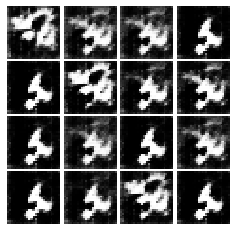

Epoch: 0, Iter: 260, D: 0.2925, G:2.669


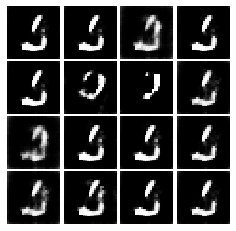

Epoch: 0, Iter: 280, D: 0.5952, G:1.84


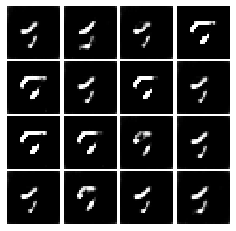

Epoch: 0, Iter: 300, D: 0.2596, G:3.882


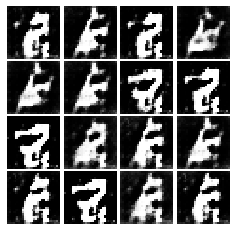

Epoch: 0, Iter: 320, D: 0.4266, G:1.708


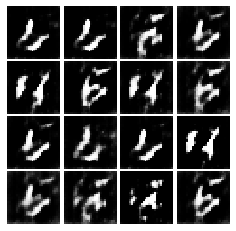

Epoch: 0, Iter: 340, D: 0.5253, G:2.372


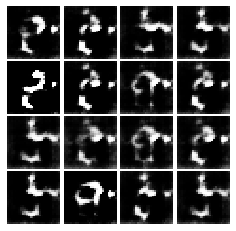

Epoch: 0, Iter: 360, D: 0.5993, G:3.734


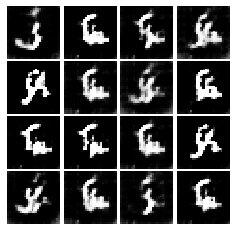

Epoch: 0, Iter: 380, D: 0.5578, G:3.022


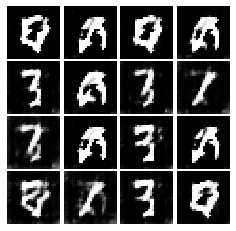

Epoch: 0, Iter: 400, D: 0.9505, G:0.1494


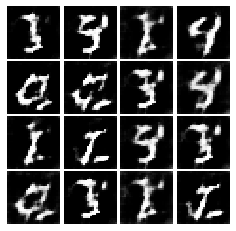

Epoch: 0, Iter: 420, D: 0.4843, G:1.753


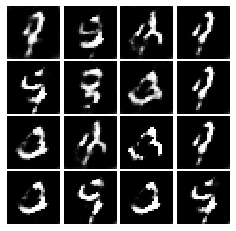

Epoch: 0, Iter: 440, D: 0.5369, G:2.045


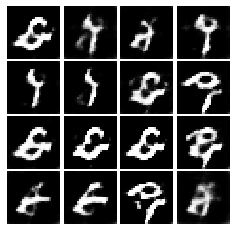

Epoch: 0, Iter: 460, D: 0.7212, G:1.812


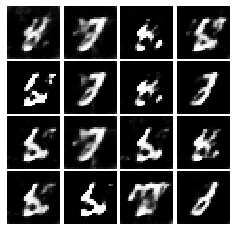

Epoch: 1, Iter: 480, D: 0.6134, G:3.694


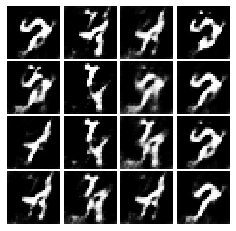

Epoch: 1, Iter: 500, D: 1.999, G:0.8109


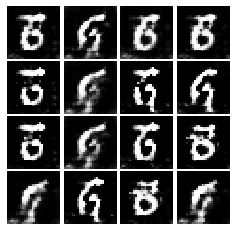

Epoch: 1, Iter: 520, D: 0.4966, G:2.026


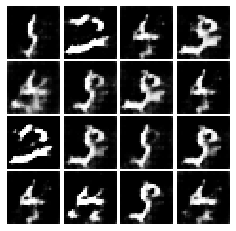

Epoch: 1, Iter: 540, D: 0.5091, G:2.429


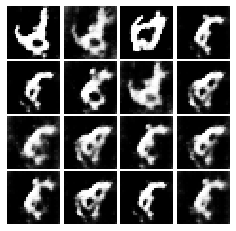

Epoch: 1, Iter: 560, D: 0.581, G:2.214


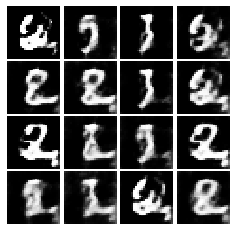

Epoch: 1, Iter: 580, D: 0.7472, G:1.871


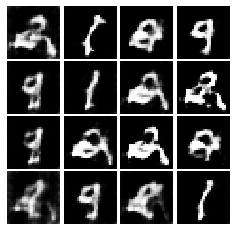

Epoch: 1, Iter: 600, D: 1.095, G:2.58


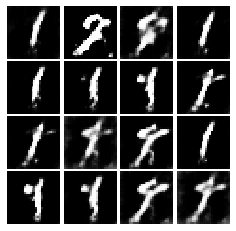

Epoch: 1, Iter: 620, D: 0.686, G:2.86


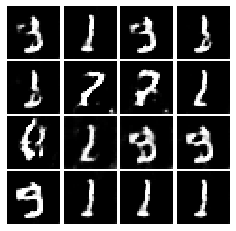

Epoch: 1, Iter: 640, D: 0.6701, G:3.544


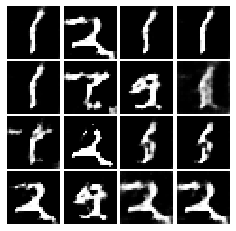

Epoch: 1, Iter: 660, D: 0.5119, G:2.204


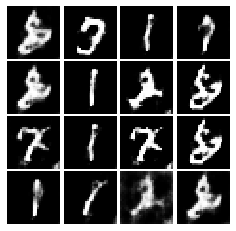

Epoch: 1, Iter: 680, D: 1.33, G:1.492


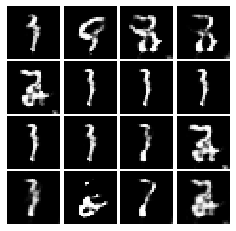

Epoch: 1, Iter: 700, D: 0.6336, G:3.014


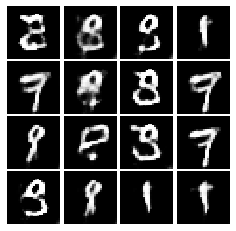

Epoch: 1, Iter: 720, D: 0.5341, G:4.385


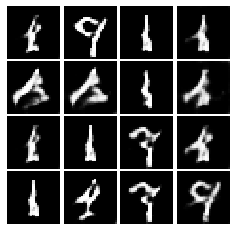

Epoch: 1, Iter: 740, D: 0.4408, G:2.038


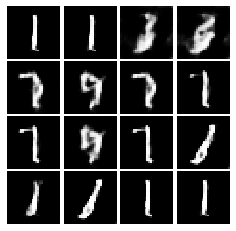

Epoch: 1, Iter: 760, D: 0.6464, G:3.996


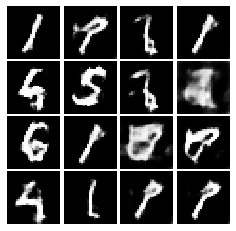

Epoch: 1, Iter: 780, D: 0.7299, G:2.364


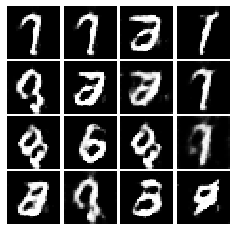

Epoch: 1, Iter: 800, D: 0.6253, G:2.386


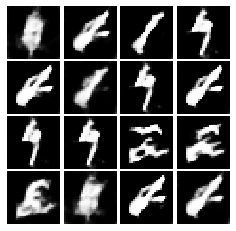

Epoch: 1, Iter: 820, D: 0.5547, G:1.876


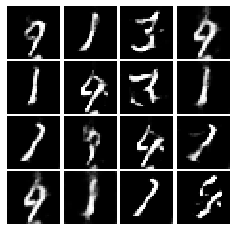

Epoch: 1, Iter: 840, D: 0.5464, G:3.37


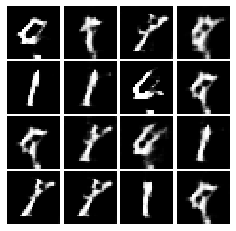

Epoch: 1, Iter: 860, D: 0.4713, G:2.275


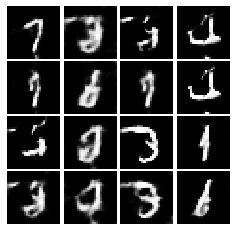

Epoch: 1, Iter: 880, D: 0.4158, G:3.126


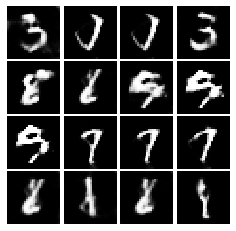

Epoch: 1, Iter: 900, D: 0.5393, G:2.326


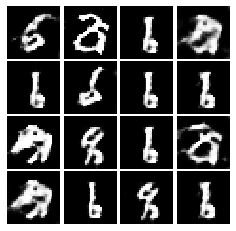

Epoch: 1, Iter: 920, D: 0.4612, G:2.287


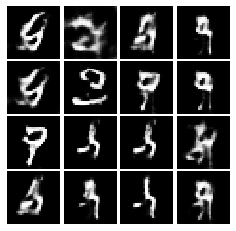

Epoch: 2, Iter: 940, D: 0.8977, G:2.302


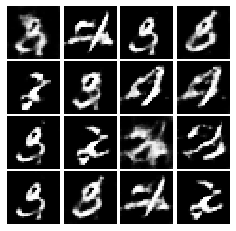

Epoch: 2, Iter: 960, D: 0.5318, G:3.484


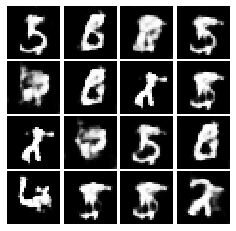

Epoch: 2, Iter: 980, D: 0.4428, G:3.365


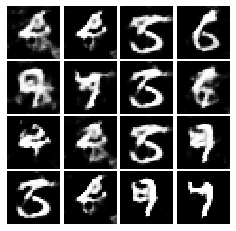

Epoch: 2, Iter: 1000, D: 0.7783, G:2.175


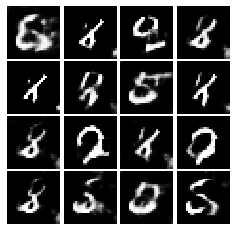

Epoch: 2, Iter: 1020, D: 0.2673, G:3.385


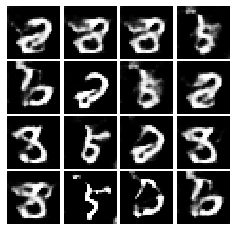

Epoch: 2, Iter: 1040, D: 2.078, G:0.8893


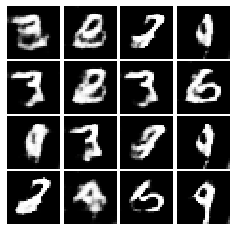

Epoch: 2, Iter: 1060, D: 0.5142, G:3.113


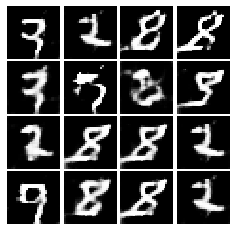

Epoch: 2, Iter: 1080, D: 0.5798, G:2.328


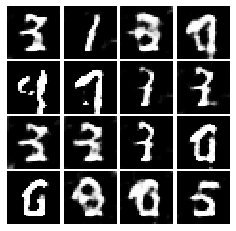

Epoch: 2, Iter: 1100, D: 0.7037, G:1.997


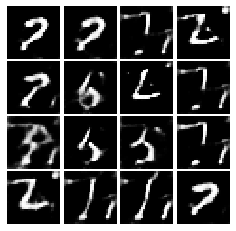

Epoch: 2, Iter: 1120, D: 0.7248, G:2.224


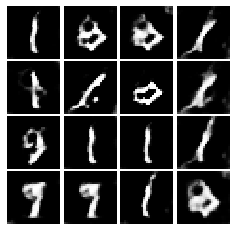

Epoch: 2, Iter: 1140, D: 0.731, G:1.834


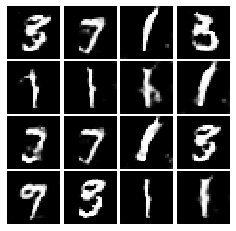

Epoch: 2, Iter: 1160, D: 0.5538, G:2.261


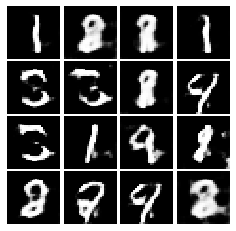

Epoch: 2, Iter: 1180, D: 0.6499, G:2.267


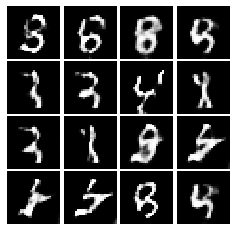

Epoch: 2, Iter: 1200, D: 0.5706, G:1.998


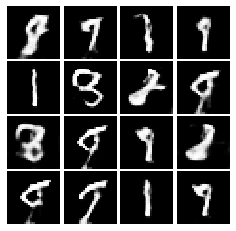

Epoch: 2, Iter: 1220, D: 0.5917, G:2.052


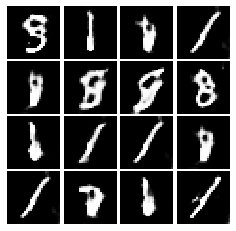

Epoch: 2, Iter: 1240, D: 0.5568, G:2.523


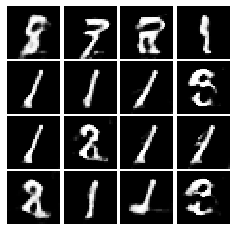

Epoch: 2, Iter: 1260, D: 0.5977, G:2.463


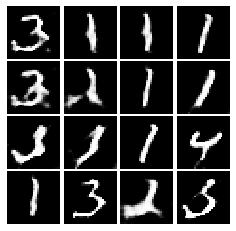

Epoch: 2, Iter: 1280, D: 0.7339, G:2.413


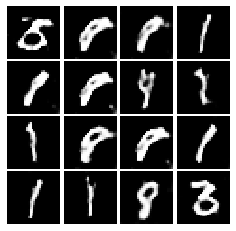

Epoch: 2, Iter: 1300, D: 0.5397, G:2.018


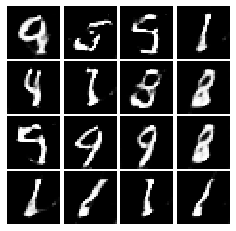

Epoch: 2, Iter: 1320, D: 0.6084, G:1.576


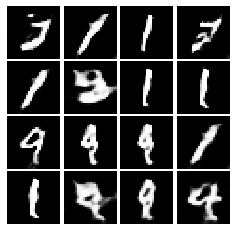

Epoch: 2, Iter: 1340, D: 0.6116, G:1.941


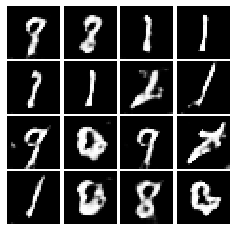

Epoch: 2, Iter: 1360, D: 0.7296, G:1.953


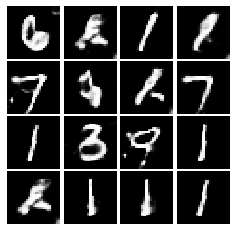

Epoch: 2, Iter: 1380, D: 0.7237, G:1.782


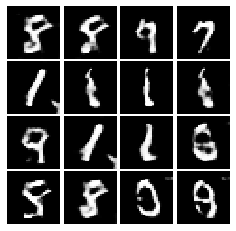

Epoch: 2, Iter: 1400, D: 0.6986, G:2.311


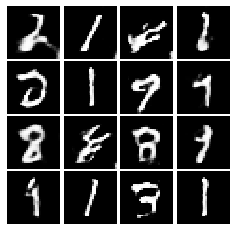

Epoch: 3, Iter: 1420, D: 0.4945, G:2.05


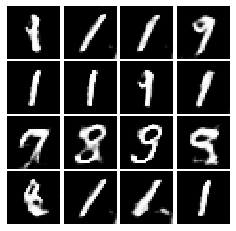

Epoch: 3, Iter: 1440, D: 0.743, G:3.327


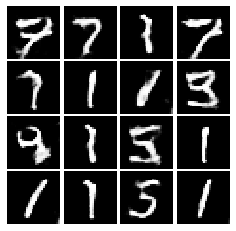

Epoch: 3, Iter: 1460, D: 0.8294, G:1.205


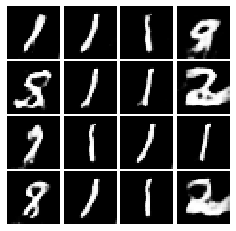

Epoch: 3, Iter: 1480, D: 0.756, G:2.203


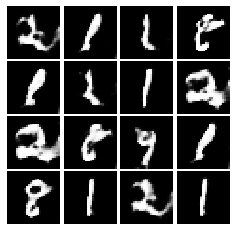

Epoch: 3, Iter: 1500, D: 0.6081, G:2.161


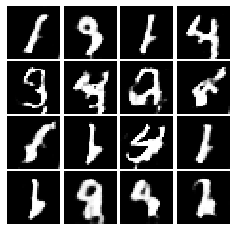

Epoch: 3, Iter: 1520, D: 0.6968, G:1.938


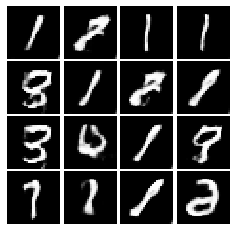

Epoch: 3, Iter: 1540, D: 0.6864, G:2.317


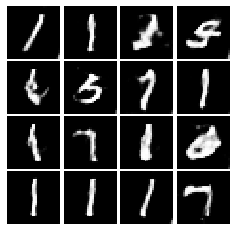

Epoch: 3, Iter: 1560, D: 0.7197, G:1.586


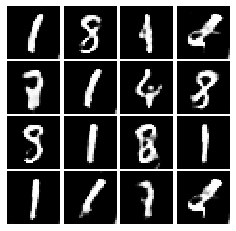

Epoch: 3, Iter: 1580, D: 0.7037, G:2.196


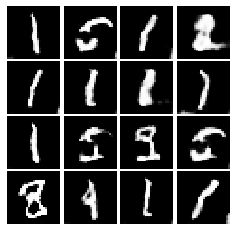

Epoch: 3, Iter: 1600, D: 0.8389, G:1.675


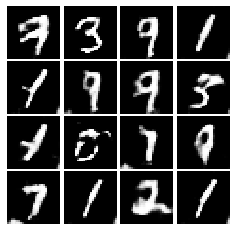

Epoch: 3, Iter: 1620, D: 0.5909, G:2.247


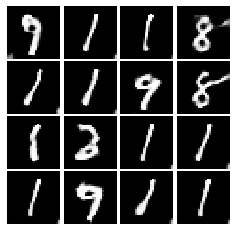

Epoch: 3, Iter: 1640, D: 0.6758, G:1.833


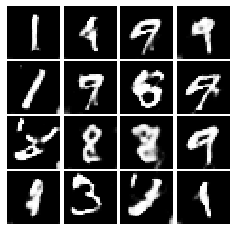

Epoch: 3, Iter: 1660, D: 0.7245, G:1.56


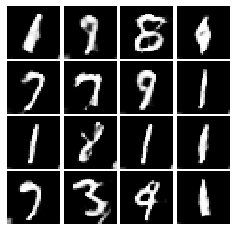

Epoch: 3, Iter: 1680, D: 0.5178, G:1.716


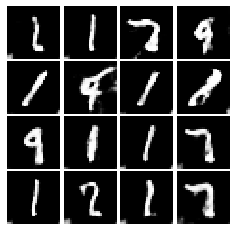

Epoch: 3, Iter: 1700, D: 0.5862, G:2.291


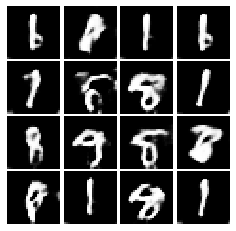

Epoch: 3, Iter: 1720, D: 0.6781, G:2.006


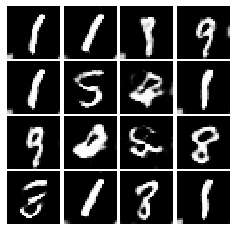

Epoch: 3, Iter: 1740, D: 0.7288, G:2.45


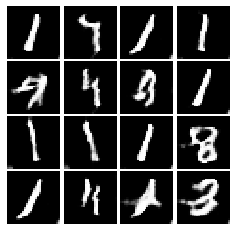

Epoch: 3, Iter: 1760, D: 0.6762, G:2.008


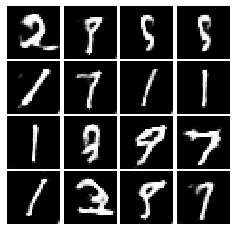

Epoch: 3, Iter: 1780, D: 0.6931, G:1.812


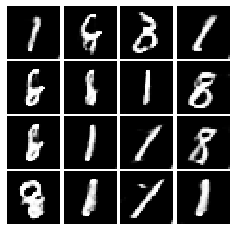

Epoch: 3, Iter: 1800, D: 0.6925, G:1.818


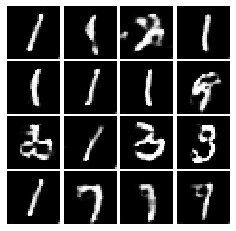

Epoch: 3, Iter: 1820, D: 0.7682, G:1.353


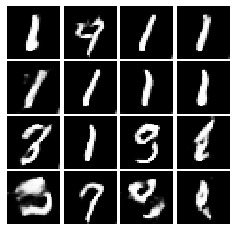

Epoch: 3, Iter: 1840, D: 0.624, G:1.864


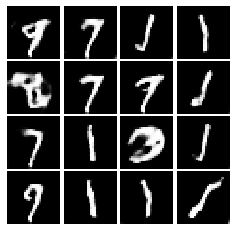

Epoch: 3, Iter: 1860, D: 0.7421, G:1.849


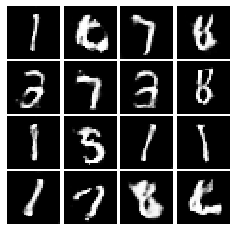

Epoch: 4, Iter: 1880, D: 0.5274, G:1.76


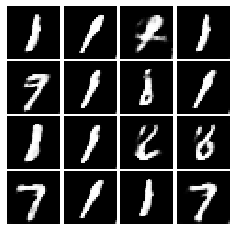

Epoch: 4, Iter: 1900, D: 0.6043, G:1.832


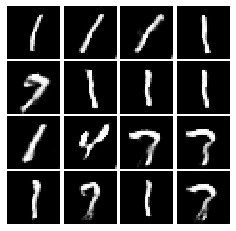

Epoch: 4, Iter: 1920, D: 0.7082, G:1.503


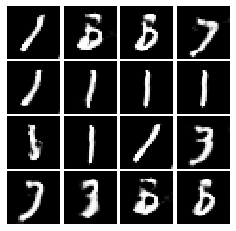

Epoch: 4, Iter: 1940, D: 0.4555, G:2.361


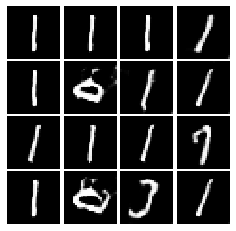

Epoch: 4, Iter: 1960, D: 0.6547, G:2.146


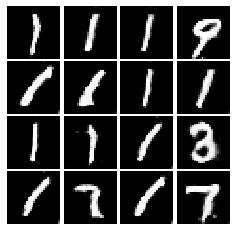

Epoch: 4, Iter: 1980, D: 0.685, G:1.807


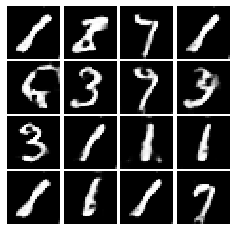

Epoch: 4, Iter: 2000, D: 1.199, G:1.103


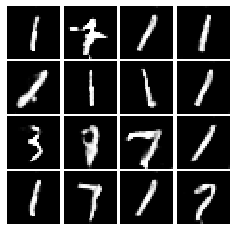

Epoch: 4, Iter: 2020, D: 0.6536, G:2.1


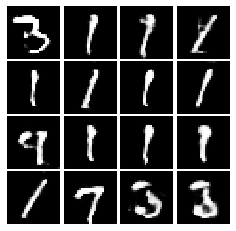

Epoch: 4, Iter: 2040, D: 0.651, G:1.939


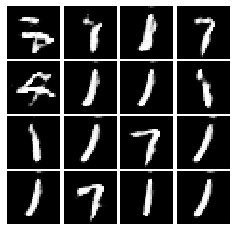

Epoch: 4, Iter: 2060, D: 0.5589, G:2.147


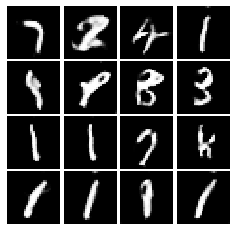

Epoch: 4, Iter: 2080, D: 0.7493, G:1.974


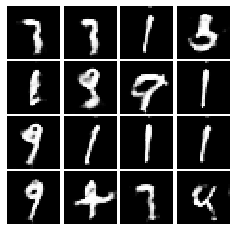

Epoch: 4, Iter: 2100, D: 0.7202, G:1.738


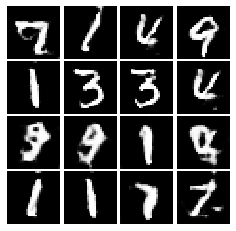

Epoch: 4, Iter: 2120, D: 0.6543, G:1.892


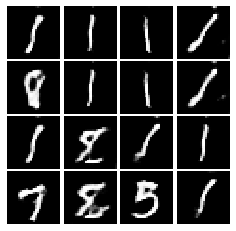

Epoch: 4, Iter: 2140, D: 0.711, G:1.367


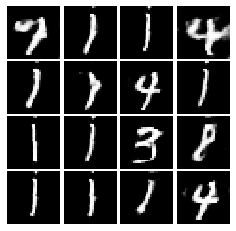

Epoch: 4, Iter: 2160, D: 0.8916, G:1.609


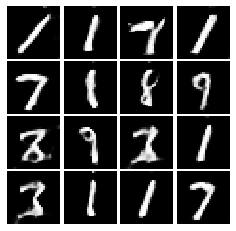

Epoch: 4, Iter: 2180, D: 0.5934, G:1.547


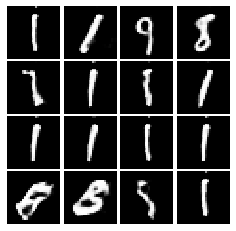

Epoch: 4, Iter: 2200, D: 0.6339, G:1.938


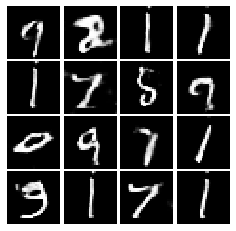

Epoch: 4, Iter: 2220, D: 0.5966, G:1.885


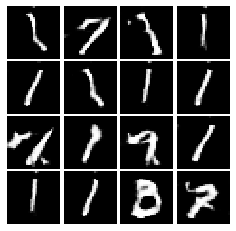

Epoch: 4, Iter: 2240, D: 0.694, G:1.676


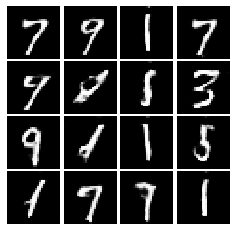

Epoch: 4, Iter: 2260, D: 0.6363, G:2.119


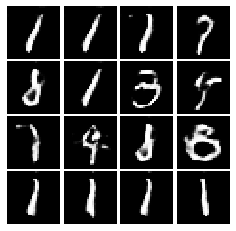

Epoch: 4, Iter: 2280, D: 0.496, G:2.044


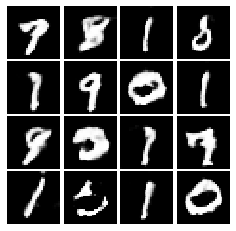

Epoch: 4, Iter: 2300, D: 0.6351, G:2.327


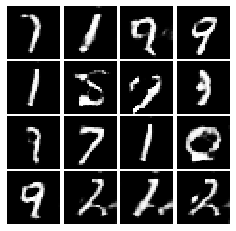

Epoch: 4, Iter: 2320, D: 0.5162, G:2.57


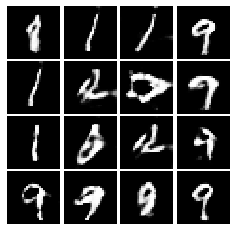

Epoch: 4, Iter: 2340, D: 0.7776, G:2.12


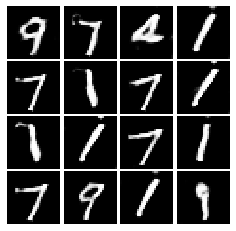

Final images


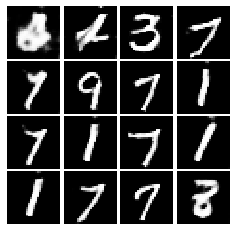

In [48]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
